#PML Group: Mitanshi, Sena, Anas, Yash, Charlotte
#DSC 478

#Importing and Loading:

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
%matplotlib inline

In [2]:
df = pd.read_csv('music_genre.csv')
df.shape
df.head(10)

,instance_id,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
0,32894.0,Röyksopp,Röyksopp's Night Out,27.0,0.00468,0.652,-1.0,0.941,0.792000,A#,0.1150,-5.201,Minor,0.0748,100.889,4-Apr,0.759,Electronic
1,46652.0,Thievery Corporation,The Shining Path,31.0,0.01270,0.622,218293.0,0.890,0.950000,D,0.1240,-7.043,Minor,0.0300,115.00200000000001,4-Apr,0.531,Electronic
2,30097.0,Dillon Francis,Hurricane,28.0,0.00306,0.620,215613.0,0.755,0.011800,G#,0.5340,-4.617,Major,0.0345,127.994,4-Apr,0.333,Electronic
3,62177.0,Dubloadz,Nitro,34.0,0.02540,0.774,166875.0,0.700,0.002530,C#,0.1570,-4.498,Major,0.2390,128.014,4-Apr,0.270,Electronic
4,24907.0,What So Not,Divide & Conquer,32.0,0.00465,0.638,222369.0,0.587,0.909000,F#,0.1570,-6.266,Major,0.0413,145.036,4-Apr,0.323,Electronic
5,89064.0,Axel Boman,Hello,47.0,0.00523,0.755,519468.0,0.731,0.854000,D,0.2160,-10.517,Minor,0.0412,?,4-Apr,0.614,Electronic
6,43760.0,Jordan Comolli,Clash,46.0,0.02890,0.572,214408.0,0.803,0.000008,B,0.1060,-4.294,Major,0.3510,149.995,4-Apr,0.230,Electronic
7,30738.0,Hraach,Delirio,43.0,0.02970,0.809,416132.0,0.706,0.903000,G,0.0635,-9.339,Minor,0.0484,120.008,4-Apr,0.761,Electronic
8,84950.0,Kayzo,NEVER ALONE,39.0,0.00299,0.509,292800.0,0.921,0.000276,F,0.1780,-3.175,Minor,0.2680,149.94799999999998,4-Apr,0.273,Electronic
9,56950.0,Shlump,Lazer Beam,22.0,0.00934,0.578,204800.0,0.731,0.011200,A,0.1110,-7.091,Minor,0.1730,139.933,4-Apr,0.203,Electronic


#Data Preprocessing
###There are '?' in the tempo column.
###Count the number of rows with '?' in the tempo column

In [3]:
question_mark_count = df['tempo'].value_counts().get('?',0)
#get the total number of rows
total_rows = len(df)
print(f"Number of '?' in tempo column: {question_mark_count}")
print(f"Total rows: {total_rows}")
print(f"Percentage of rows with '?': {question_mark_count / total_rows * 100:.2f}%")

Number of '?' in tempo column: 4980
Total rows: 50005
Percentage of rows with '?': 9.96%


In [4]:
df.dtypes

,0
instance_id,float64
artist_name,object
track_name,object
popularity,float64
acousticness,float64
danceability,float64
duration_ms,float64
energy,float64
instrumentalness,float64
key,object


we want to convert tempo into a numeric type, instead of keeping it as an object type. Because of the ? symbos, it likely has #been read as an object type, rather than a numeric type as it usually is with bpm.
we need to convert to numeric type so we can perform mathematical operations (mean, median, etc.), and to make it easier to #visualize and model the data.

In [5]:
# Replace '?' values with NaN without using inplace=True
df['tempo'] = df['tempo'].replace('?', np.nan)

# Then convert tempo to a numeric type, coercing any non-numeric values to NaN
df['tempo'] = pd.to_numeric(df['tempo'], errors='coerce')

# Verify the change
print(df['tempo'].dtype)  # Should output 'float64' if conversion is successful

float64


###We can drop all NaN values from the data set

In [6]:
df=df.dropna()
df.describe(include='all')

,instance_id,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
count,45020.000000,45020,45020,45020.000000,45020.000000,45020.000000,4.502000e+04,45020.000000,45020.000000,45020,45020.000000,45020.000000,45020,45020.000000,45020.000000,45020,45020.000000,45020
unique,NaN,6603,38026,NaN,NaN,NaN,NaN,NaN,NaN,12,NaN,NaN,2,NaN,NaN,4,NaN,10
top,NaN,empty_field,Home,NaN,NaN,NaN,NaN,NaN,NaN,G,NaN,NaN,Major,NaN,NaN,4-Apr,NaN,Rock
freq,NaN,2229,16,NaN,NaN,NaN,NaN,NaN,NaN,5130,NaN,NaN,28874,NaN,NaN,40301,NaN,4561
mean,55884.691892,NaN,NaN,44.263327,0.306596,0.558532,2.211695e+05,0.599553,0.181843,NaN,0.193951,-9.137016,NaN,0.093783,119.952961,NaN,0.456394,NaN
std,20728.197040,NaN,NaN,15.553972,0.341391,0.178858,1.276884e+05,0.264510,0.325847,NaN,0.161715,6.156400,NaN,0.101469,30.641701,NaN,0.247161,NaN
min,20002.000000,NaN,NaN,0.000000,0.000000,0.059600,-1.000000e+00,0.000792,0.000000,NaN,0.009670,-47.046000,NaN,0.022300,34.347000,NaN,0.000000,NaN
25%,38000.750000,NaN,NaN,34.000000,0.020100,0.442000,1.747230e+05,0.432000,0.000000,NaN,0.096900,-10.860000,NaN,0.036100,94.941500,NaN,0.257000,NaN
50%,55857.500000,NaN,NaN,45.000000,0.145000,0.568000,2.194385e+05,0.642000,0.000159,NaN,0.126000,-7.284000,NaN,0.048900,119.879000,NaN,0.448000,NaN
75%,73856.500000,NaN,NaN,56.000000,0.551000,0.687000,2.686400e+05,0.815250,0.154000,NaN,0.244000,-5.177000,NaN,0.098800,140.471250,NaN,0.648000,NaN


###Visualizing the tempo column to see if it follows a rougly normal or skewed distribution.

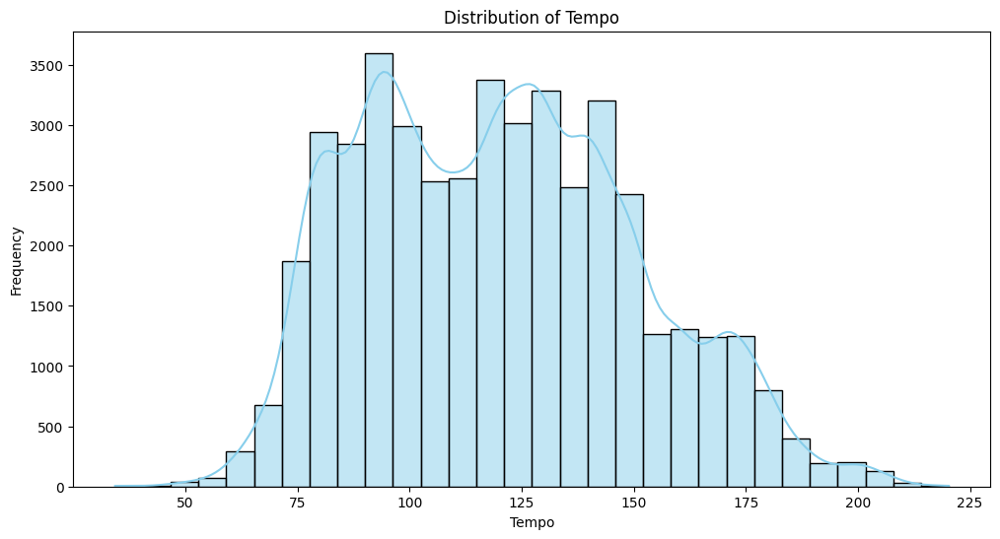

In [7]:
tempo_data = df['tempo']

#set up the plotting figure
plt.figure(figsize=(12,6))

#histogram with density line
sns.histplot(tempo_data, kde=True, bins=30, color='skyblue')

#labels and title
plt.xlabel('Tempo')
plt.ylabel('Frequency')
plt.title('Distribution of Tempo')

#show plot
plt.show()

Values seem multi-modal but the distribution is almost gaussian so it will be better to just assign mean values to the #variable in replace of nan values.

since it looks to be pretty normally distributed with a slight skew:

In [8]:
#Fill in the NaN tempo values based on tempo genre averages
df['tempo'] = df.groupby('music_genre')['tempo'].transform(lambda x: x.fillna(x.mean()))

In [9]:
#check for NaN in tempo:
df.head(10)

,instance_id,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
0,32894.0,Röyksopp,Röyksopp's Night Out,27.0,0.00468,0.652,-1.0,0.941,0.792000,A#,0.1150,-5.201,Minor,0.0748,100.889,4-Apr,0.759,Electronic
1,46652.0,Thievery Corporation,The Shining Path,31.0,0.01270,0.622,218293.0,0.890,0.950000,D,0.1240,-7.043,Minor,0.0300,115.002,4-Apr,0.531,Electronic
2,30097.0,Dillon Francis,Hurricane,28.0,0.00306,0.620,215613.0,0.755,0.011800,G#,0.5340,-4.617,Major,0.0345,127.994,4-Apr,0.333,Electronic
3,62177.0,Dubloadz,Nitro,34.0,0.02540,0.774,166875.0,0.700,0.002530,C#,0.1570,-4.498,Major,0.2390,128.014,4-Apr,0.270,Electronic
4,24907.0,What So Not,Divide & Conquer,32.0,0.00465,0.638,222369.0,0.587,0.909000,F#,0.1570,-6.266,Major,0.0413,145.036,4-Apr,0.323,Electronic
6,43760.0,Jordan Comolli,Clash,46.0,0.02890,0.572,214408.0,0.803,0.000008,B,0.1060,-4.294,Major,0.3510,149.995,4-Apr,0.230,Electronic
7,30738.0,Hraach,Delirio,43.0,0.02970,0.809,416132.0,0.706,0.903000,G,0.0635,-9.339,Minor,0.0484,120.008,4-Apr,0.761,Electronic
8,84950.0,Kayzo,NEVER ALONE,39.0,0.00299,0.509,292800.0,0.921,0.000276,F,0.1780,-3.175,Minor,0.2680,149.948,4-Apr,0.273,Electronic
9,56950.0,Shlump,Lazer Beam,22.0,0.00934,0.578,204800.0,0.731,0.011200,A,0.1110,-7.091,Minor,0.1730,139.933,4-Apr,0.203,Electronic
10,49030.0,Chase & Status,Lost & Not Found - Acoustic,30.0,0.85500,0.607,170463.0,0.158,0.000000,F#,0.1060,-13.787,Minor,0.0345,57.528,4-Apr,0.307,Electronic


<ipython-input-10-507d234a382b>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['tempo'])


<Axes: xlabel='tempo', ylabel='Density'>

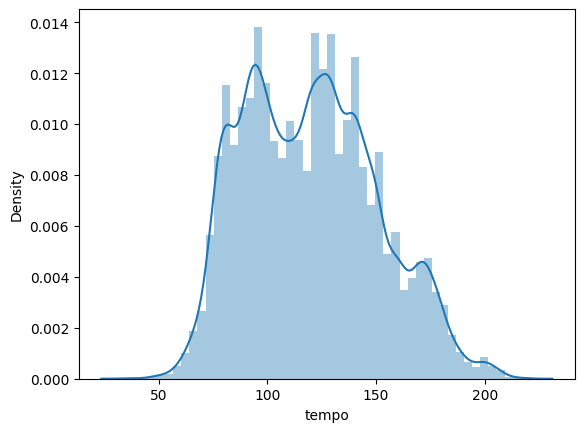

In [10]:
sns.distplot(df['tempo'])

In [11]:
#remove any leftover Na values
df = df.dropna()
df.describe()

,instance_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
count,45020.000000,45020.000000,45020.000000,45020.000000,4.502000e+04,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000
mean,55884.691892,44.263327,0.306596,0.558532,2.211695e+05,0.599553,0.181843,0.193951,-9.137016,0.093783,119.952961,0.456394
std,20728.197040,15.553972,0.341391,0.178858,1.276884e+05,0.264510,0.325847,0.161715,6.156400,0.101469,30.641701,0.247161
min,20002.000000,0.000000,0.000000,0.059600,-1.000000e+00,0.000792,0.000000,0.009670,-47.046000,0.022300,34.347000,0.000000
25%,38000.750000,34.000000,0.020100,0.442000,1.747230e+05,0.432000,0.000000,0.096900,-10.860000,0.036100,94.941500,0.257000
50%,55857.500000,45.000000,0.145000,0.568000,2.194385e+05,0.642000,0.000159,0.126000,-7.284000,0.048900,119.879000,0.448000
75%,73856.500000,56.000000,0.551000,0.687000,2.686400e+05,0.815250,0.154000,0.244000,-5.177000,0.098800,140.471250,0.648000
max,91759.000000,99.000000,0.996000,0.986000,4.497994e+06,0.999000,0.996000,1.000000,3.744000,0.942000,220.276000,0.992000


###Let's look at all the data that are float data types in a box and whiskers plot:

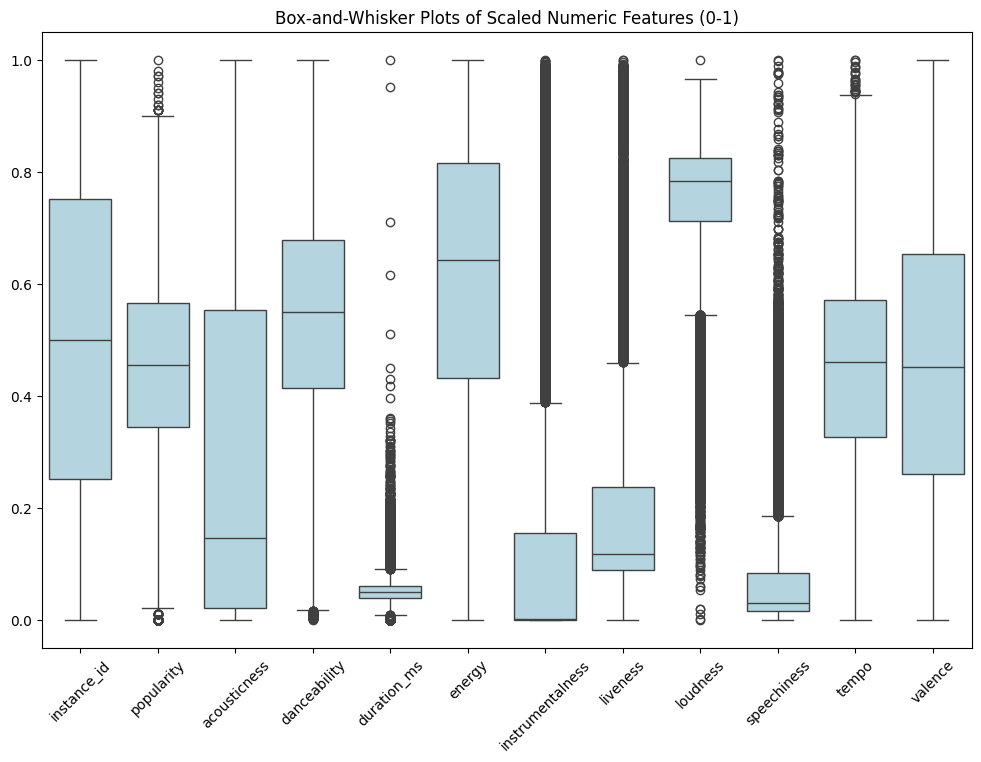

In [12]:
float_columns = df.select_dtypes(include=['float64']).columns
scaler = MinMaxScaler()
df[float_columns] = scaler.fit_transform(df[float_columns])
plt.figure(figsize=(12, 8))
sns.boxplot(data=df[float_columns],color="lightblue")
plt.xticks(rotation=45)
plt.title("Box-and-Whisker Plots of Scaled Numeric Features (0-1)")
plt.show()

Categorical Varaibles:

In [13]:
df['track_name'].value_counts()

,count
track_name,
Home,16
Forever,14
Without You,13
Summertime,12
Wake Up,12
...,...
Come As You Are,1
The Billy Williams Story,1
Fatigued,1


###Handling font corruption and weird symbols for some track_name(s) and artist_name(s)

In [14]:
# Function to transform corrupted symbols into readable text
def decode_text(text):
    if isinstance(text, str):
        try:
            # Decode using 'latin1' and then encode back to 'utf-8' to make symbols readable
            return text.encode('latin1').decode('utf-8')
        except (UnicodeEncodeError, UnicodeDecodeError):
            # If decoding fails, return the original text
            return text
    else:
        # Return non-string values as they are
        return text

# Apply the function to the 'track_name' and 'artist_name' columns
df['track_name'] = df['track_name'].apply(decode_text)
df['artist_name'] = df['artist_name'].apply(decode_text)

In [15]:
df.head(8761)

,instance_id,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,obtained_date,valence,music_genre
0,0.179662,Röyksopp,Röyksopp's Night Out,0.272727,0.004699,0.639465,0.000000,0.941896,0.795181,A#,0.106358,0.823883,Minor,0.057084,0.357889,4-Apr,0.765121,Electronic
1,0.371392,Thievery Corporation,The Shining Path,0.313131,0.012751,0.607081,0.048531,0.890804,0.953815,D,0.115446,0.787616,Minor,0.008372,0.433795,4-Apr,0.535282,Electronic
2,0.140683,Dillon Francis,Hurricane,0.282828,0.003072,0.604922,0.047936,0.755562,0.011847,G#,0.529450,0.835381,Major,0.013265,0.503671,4-Apr,0.335685,Electronic
3,0.587748,Dubloadz,Nitro,0.343434,0.025502,0.771157,0.037100,0.700463,0.002540,C#,0.148769,0.837724,Major,0.235620,0.503778,4-Apr,0.272177,Electronic
4,0.068356,What So Not,Divide & Conquer,0.323232,0.004669,0.624352,0.049438,0.587260,0.912651,F#,0.148769,0.802914,Major,0.020659,0.595329,4-Apr,0.325605,Electronic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9774,0.822819,Eminence Symphony Orchestra,Plans by the Two / Hope and Dreams,0.131313,0.776104,0.391192,0.057928,0.168510,0.676707,C,0.057991,0.640854,Major,0.011634,0.481071,4-Apr,0.256048,Anime
9775,0.496286,Aoi Teshima,Kiss The Girl,0.222222,0.803213,0.667530,0.053719,0.243645,0.008474,B,0.098280,0.657019,Major,0.012178,0.460402,4-Apr,0.422379,Anime
9776,0.820101,Mika Nakashima,Forget Me Not,0.161616,0.525100,0.477547,0.074522,0.387903,0.000000,C#,0.229550,0.808053,Major,0.003914,0.567760,4-Apr,0.445565,Anime
9777,0.625388,Eve,Perfect Seimei,0.272727,0.000010,0.561744,0.041120,0.799641,0.018675,F,0.087779,0.829592,Major,0.013048,0.353135,4-Apr,0.223790,Anime


In [16]:
df['artist_name'].value_counts()

,count
artist_name,
empty_field,2229
Nobuo Uematsu,387
Wolfgang Amadeus Mozart,365
Ludwig van Beethoven,287
Johann Sebastian Bach,286
...,...
The Harptones,1
Ma Rainey,1
Phonte,1


###We can clearly eliminate artist name from the data as it is not going to be useful in predictions.

In [17]:
df['obtained_date'].value_counts()

,count
obtained_date,
4-Apr,40301
3-Apr,3657
5-Apr,710
1-Apr,352


###Obtained dates are information only to keep track when it was selected in the sample but will not help in predicting anything and it can just mislead our model. So we can remove this variable from our data.

In [18]:
df.drop(['obtained_date'], axis=1, inplace=True)
df.head()

,instance_id,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence,music_genre
0,0.179662,Röyksopp,Röyksopp's Night Out,0.272727,0.004699,0.639465,0.000000,0.941896,0.795181,A#,0.106358,0.823883,Minor,0.057084,0.357889,0.765121,Electronic
1,0.371392,Thievery Corporation,The Shining Path,0.313131,0.012751,0.607081,0.048531,0.890804,0.953815,D,0.115446,0.787616,Minor,0.008372,0.433795,0.535282,Electronic
2,0.140683,Dillon Francis,Hurricane,0.282828,0.003072,0.604922,0.047936,0.755562,0.011847,G#,0.529450,0.835381,Major,0.013265,0.503671,0.335685,Electronic
3,0.587748,Dubloadz,Nitro,0.343434,0.025502,0.771157,0.037100,0.700463,0.002540,C#,0.148769,0.837724,Major,0.235620,0.503778,0.272177,Electronic
4,0.068356,What So Not,Divide & Conquer,0.323232,0.004669,0.624352,0.049438,0.587260,0.912651,F#,0.148769,0.802914,Major,0.020659,0.595329,0.325605,Electronic


###Let's look at the categorical data, specifically music genre:

In [19]:
genre=sorted(df['music_genre'].unique().tolist())
for genre in genre:
    print(genre)

Alternative
Anime
Blues
Classical
Country
Electronic
Hip-Hop
Jazz
Rap
Rock


###Let's look at the catergorical data now, specifically key

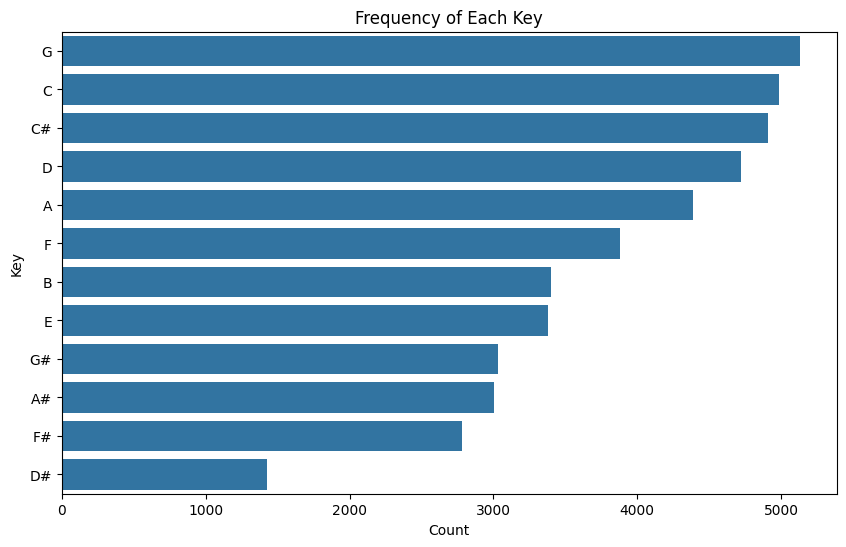

,count
key,
G,5130
C,4983
C#,4906
D,4719
A,4384
F,3880
B,3398
E,3379
G#,3031


In [20]:
plt.figure(figsize=(10, 6))
sns.countplot(y='key', data=df, order=df['key'].value_counts().index)
plt.title('Frequency of Each Key')
plt.xlabel('Count')
plt.ylabel('Key')
plt.show()

df['key'].value_counts()

###Keys and mode are two useful categorical variables and needs to be in the data. So we can convert these to dummy variables.

In [21]:
dfKey = pd.get_dummies(df['key'], prefix='Key', dtype=int)
dfMode = pd.get_dummies(df['mode'], prefix='Mode', dtype=int)
dfKey.head()

,Key_A,Key_A#,Key_B,Key_C,Key_C#,Key_D,Key_D#,Key_E,Key_F,Key_F#,Key_G,Key_G#
0,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,1,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,1,0,0


In [22]:
df = pd.concat([df, dfKey, dfMode], axis=1)
df.drop(['key', 'mode'], axis=1, inplace=True)
df.head()

,instance_id,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,...,Key_C#,Key_D,Key_D#,Key_E,Key_F,Key_F#,Key_G,Key_G#,Mode_Major,Mode_Minor
0,0.179662,Röyksopp,Röyksopp's Night Out,0.272727,0.004699,0.639465,0.000000,0.941896,0.795181,0.106358,...,0,0,0,0,0,0,0,0,0,1
1,0.371392,Thievery Corporation,The Shining Path,0.313131,0.012751,0.607081,0.048531,0.890804,0.953815,0.115446,...,0,1,0,0,0,0,0,0,0,1
2,0.140683,Dillon Francis,Hurricane,0.282828,0.003072,0.604922,0.047936,0.755562,0.011847,0.529450,...,0,0,0,0,0,0,0,1,1,0
3,0.587748,Dubloadz,Nitro,0.343434,0.025502,0.771157,0.037100,0.700463,0.002540,0.148769,...,1,0,0,0,0,0,0,0,1,0
4,0.068356,What So Not,Divide & Conquer,0.323232,0.004669,0.624352,0.049438,0.587260,0.912651,0.148769,...,0,0,0,0,0,1,0,0,1,0


In [23]:
df.drop(['Mode_Minor'], axis=1, inplace=True)
df.head()

,instance_id,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,...,Key_C,Key_C#,Key_D,Key_D#,Key_E,Key_F,Key_F#,Key_G,Key_G#,Mode_Major
0,0.179662,Röyksopp,Röyksopp's Night Out,0.272727,0.004699,0.639465,0.000000,0.941896,0.795181,0.106358,...,0,0,0,0,0,0,0,0,0,0
1,0.371392,Thievery Corporation,The Shining Path,0.313131,0.012751,0.607081,0.048531,0.890804,0.953815,0.115446,...,0,0,1,0,0,0,0,0,0,0
2,0.140683,Dillon Francis,Hurricane,0.282828,0.003072,0.604922,0.047936,0.755562,0.011847,0.529450,...,0,0,0,0,0,0,0,0,1,1
3,0.587748,Dubloadz,Nitro,0.343434,0.025502,0.771157,0.037100,0.700463,0.002540,0.148769,...,0,1,0,0,0,0,0,0,0,1
4,0.068356,What So Not,Divide & Conquer,0.323232,0.004669,0.624352,0.049438,0.587260,0.912651,0.148769,...,0,0,0,0,0,0,1,0,0,1


###Processing Numeric Columns:

In [24]:
pd.set_option('display.max_columns', None)
df.describe()

,instance_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,Key_A,Key_A#,Key_B,Key_C,Key_C#,Key_D,Key_D#,Key_E,Key_F,Key_F#,Key_G,Key_G#,Mode_Major
count,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000,45020.000000
mean,0.500058,0.447104,0.307827,0.538571,0.049171,0.599836,0.182573,0.186080,0.746387,0.077724,0.460423,0.460075,0.097379,0.066704,0.075478,0.110684,0.108974,0.104820,0.031697,0.075056,0.086184,0.061750,0.113949,0.067326,0.641359
std,0.288867,0.157111,0.342762,0.193068,0.028388,0.264984,0.327155,0.163294,0.121213,0.110328,0.164803,0.249154,0.296476,0.249511,0.264163,0.313744,0.311610,0.306325,0.175194,0.263484,0.280639,0.240704,0.317753,0.250588,0.479607
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.250829,0.343434,0.020181,0.412781,0.038845,0.431982,0.000000,0.088082,0.712463,0.015005,0.325901,0.259073,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.499679,0.454545,0.145582,0.548791,0.048786,0.642359,0.000160,0.117466,0.782871,0.028922,0.460025,0.451613,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.750512,0.565657,0.553213,0.677245,0.059725,0.815920,0.154618,0.236618,0.824355,0.083179,0.570778,0.653226,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Now, our dataset has been converted to numeric for all categorical variables and it is ready to do outliers check for any numeric variable.

Instance ID is not going to be helpful in prediction so we can remove that.

In [25]:
df.drop(['instance_id'], axis=1, inplace=True)
df.head()

,artist_name,track_name,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,music_genre,Key_A,Key_A#,Key_B,Key_C,Key_C#,Key_D,Key_D#,Key_E,Key_F,Key_F#,Key_G,Key_G#,Mode_Major
0,Röyksopp,Röyksopp's Night Out,0.272727,0.004699,0.639465,0.000000,0.941896,0.795181,0.106358,0.823883,0.057084,0.357889,0.765121,Electronic,0,1,0,0,0,0,0,0,0,0,0,0,0
1,Thievery Corporation,The Shining Path,0.313131,0.012751,0.607081,0.048531,0.890804,0.953815,0.115446,0.787616,0.008372,0.433795,0.535282,Electronic,0,0,0,0,0,1,0,0,0,0,0,0,0
2,Dillon Francis,Hurricane,0.282828,0.003072,0.604922,0.047936,0.755562,0.011847,0.529450,0.835381,0.013265,0.503671,0.335685,Electronic,0,0,0,0,0,0,0,0,0,0,0,1,1
3,Dubloadz,Nitro,0.343434,0.025502,0.771157,0.037100,0.700463,0.002540,0.148769,0.837724,0.235620,0.503778,0.272177,Electronic,0,0,0,0,1,0,0,0,0,0,0,0,1
4,What So Not,Divide & Conquer,0.323232,0.004669,0.624352,0.049438,0.587260,0.912651,0.148769,0.802914,0.020659,0.595329,0.325605,Electronic,0,0,0,0,0,0,0,0,0,1,0,0,1


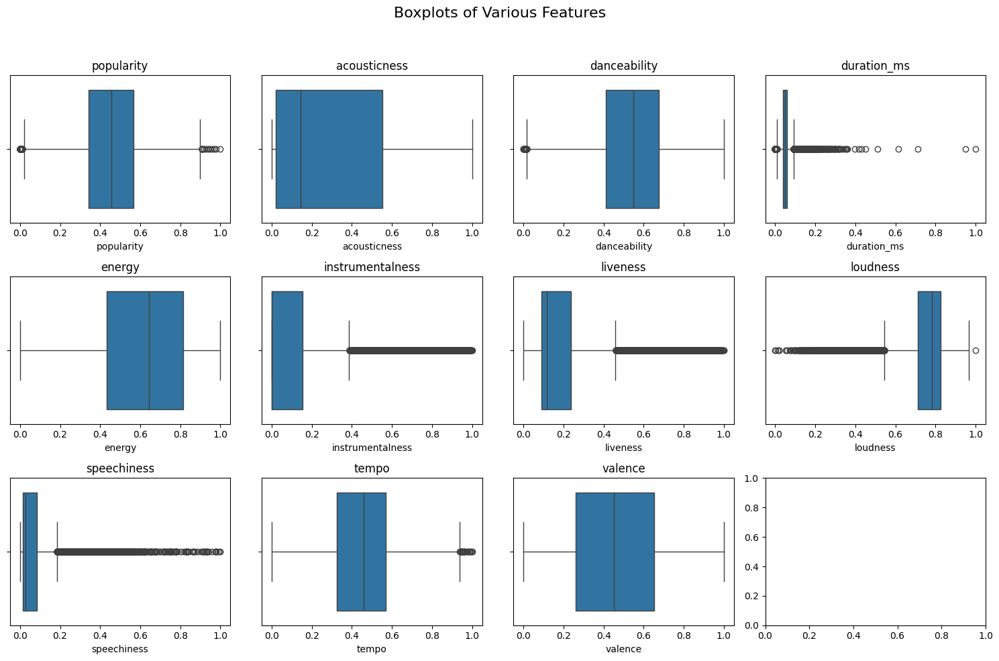

In [26]:
elements = ['popularity', 'acousticness', 'danceability', 'duration_ms', 'energy',
            'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence']

fig, axes = plt.subplots(3, 4, figsize=(15, 10))
fig.suptitle("Boxplots of Various Features", fontsize=16)
axes = axes.flatten()
for i, ele in enumerate(elements):
    sns.boxplot(x=df[ele], ax=axes[i])
    axes[i].set_title(ele)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

Check for outliers:

In [27]:
df['duration_min'] = df['duration_ms']/60000
df.drop(['duration_ms'], axis=1, inplace=True)
df.head()

,artist_name,track_name,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,music_genre,Key_A,Key_A#,Key_B,Key_C,Key_C#,Key_D,Key_D#,Key_E,Key_F,Key_F#,Key_G,Key_G#,Mode_Major,duration_min
0,Röyksopp,Röyksopp's Night Out,0.272727,0.004699,0.639465,0.941896,0.795181,0.106358,0.823883,0.057084,0.357889,0.765121,Electronic,0,1,0,0,0,0,0,0,0,0,0,0,0,0.000000e+00
1,Thievery Corporation,The Shining Path,0.313131,0.012751,0.607081,0.890804,0.953815,0.115446,0.787616,0.008372,0.433795,0.535282,Electronic,0,0,0,0,0,1,0,0,0,0,0,0,0,8.088567e-07
2,Dillon Francis,Hurricane,0.282828,0.003072,0.604922,0.755562,0.011847,0.529450,0.835381,0.013265,0.503671,0.335685,Electronic,0,0,0,0,0,0,0,0,0,0,0,1,1,7.989263e-07
3,Dubloadz,Nitro,0.343434,0.025502,0.771157,0.700463,0.002540,0.148769,0.837724,0.235620,0.503778,0.272177,Electronic,0,0,0,0,1,0,0,0,0,0,0,0,1,6.183348e-07
4,What So Not,Divide & Conquer,0.323232,0.004669,0.624352,0.587260,0.912651,0.148769,0.802914,0.020659,0.595329,0.325605,Electronic,0,0,0,0,0,0,0,0,0,1,0,0,1,8.239597e-07


In [28]:
df['duration_min'].describe()

,duration_min
count,4.502000e+04
mean,8.195151e-07
std,4.731309e-07
min,0.000000e+00
25%,6.474144e-07
50%,8.131012e-07
75%,9.954102e-07
max,1.666667e-05


We can see many outliers which are below 0 and above 10 minutes. Because duration can't be negative and 80 minutes for music album doesnot looks good so we can choose range of 0-10 minutes which makes most sense and remove all other points.

In [29]:
df = df[(df['duration_min'] > 0) & (df['duration_min'] <= 10)]
df.head()

,artist_name,track_name,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,music_genre,Key_A,Key_A#,Key_B,Key_C,Key_C#,Key_D,Key_D#,Key_E,Key_F,Key_F#,Key_G,Key_G#,Mode_Major,duration_min
1,Thievery Corporation,The Shining Path,0.313131,0.012751,0.607081,0.890804,0.953815,0.115446,0.787616,0.008372,0.433795,0.535282,Electronic,0,0,0,0,0,1,0,0,0,0,0,0,0,8.088567e-07
2,Dillon Francis,Hurricane,0.282828,0.003072,0.604922,0.755562,0.011847,0.529450,0.835381,0.013265,0.503671,0.335685,Electronic,0,0,0,0,0,0,0,0,0,0,0,1,1,7.989263e-07
3,Dubloadz,Nitro,0.343434,0.025502,0.771157,0.700463,0.002540,0.148769,0.837724,0.235620,0.503778,0.272177,Electronic,0,0,0,0,1,0,0,0,0,0,0,0,1,6.183348e-07
4,What So Not,Divide & Conquer,0.323232,0.004669,0.624352,0.587260,0.912651,0.148769,0.802914,0.020659,0.595329,0.325605,Electronic,0,0,0,0,0,0,0,0,0,1,0,0,1,8.239597e-07
6,Jordan Comolli,Clash,0.464646,0.029016,0.553109,0.803648,0.000008,0.097271,0.841741,0.357399,0.622001,0.231855,Electronic,0,0,1,0,0,0,0,0,0,0,0,0,1,7.944614e-07


In [30]:
df['loudness'].describe()

,loudness
count,40560.000000
mean,0.746596
std,0.121179
min,0.000000
25%,0.712798
50%,0.783008
75%,0.824414
max,1.000000


<ipython-input-31-3fcff2deb366>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df['loudness'])


<Axes: xlabel='loudness', ylabel='Density'>

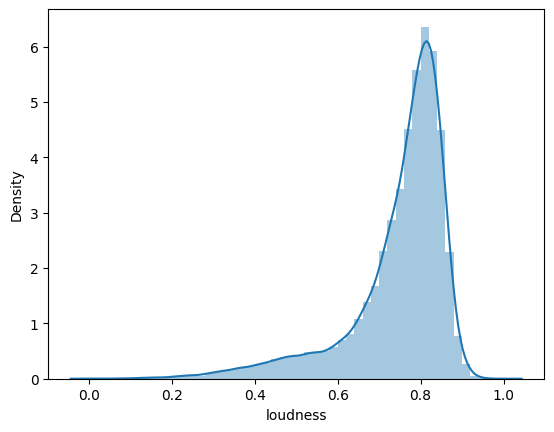

In [31]:
sns.distplot(df['loudness'])

There seems outliers in loudness and tempo according to boxplots. However, the minimum values totally make sense for given music hence, we can keep as it is.

Standardizing (min-max scaling)

Lets look at distribution plots and make decisions on what scale we are going to apply for each feature.

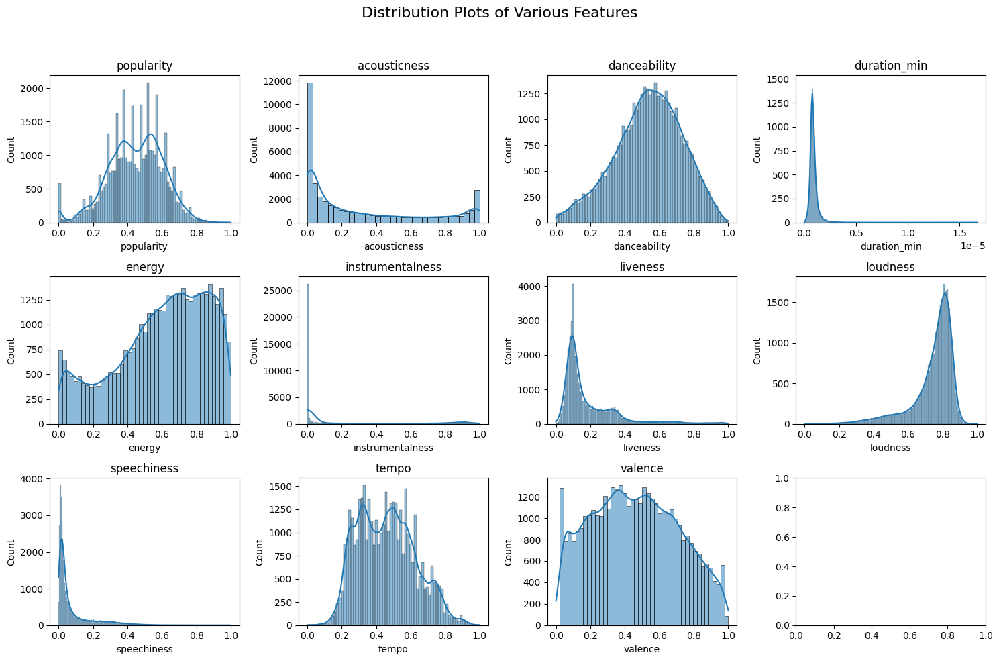

In [32]:
elements = ['popularity', 'acousticness', 'danceability', 'duration_min', 'energy',
            'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence']

fig, axes = plt.subplots(3, 4, figsize=(15, 10))
fig.suptitle("Distribution Plots of Various Features", fontsize=16)

axes = axes.flatten()

for i, ele in enumerate(elements):
    sns.histplot(df[ele], kde=True, ax=axes[i])  #kde=True to include a density line
    axes[i].set_title(ele)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

As per distribution plots, 'tempo', 'duration_min', 'loudness' and 'popularity' needs to be transformed. Other features are already scaled.

loudness          energy              0.838143
energy            loudness            0.838143
valence           danceability        0.435589
danceability      valence             0.435589
energy            valence             0.396397
valence           energy              0.396397
danceability      loudness            0.389374
loudness          danceability        0.389374
acousticness      instrumentalness    0.387188
instrumentalness  acousticness        0.387188
danceability      popularity          0.357883
popularity        danceability        0.357883
valence           loudness            0.342023
loudness          valence             0.342023
popularity        loudness            0.317655
loudness          popularity          0.317655
danceability      speechiness         0.277976
speechiness       danceability        0.277976
tempo             energy              0.264170
energy            tempo               0.264170
dtype: float64


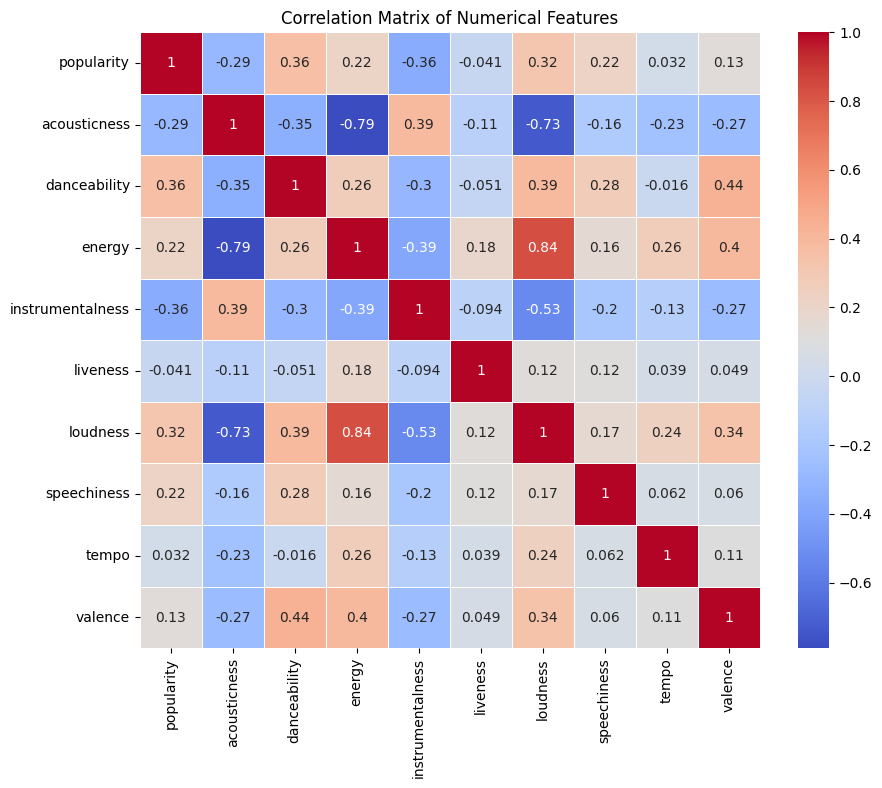

In [33]:
numerical_features = ['popularity', 'acousticness', 'danceability', 'energy','instrumentalness', 'liveness', 'loudness','speechiness', 'tempo', 'valence']
correlation_matrix = df[numerical_features].corr()

#top 10 correlations
top_correlations = correlation_matrix.unstack().sort_values(ascending=False)
top_correlations = top_correlations[top_correlations < 1].head(20)

print(top_correlations)
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Numerical Features')
plt.show()

In [34]:
print(f"Number of features: {len(numerical_features)}")
#no. of features no too high

Number of features: 10


In [35]:
df['tempo'] = (df['tempo'] - df['tempo'].min())/(df['tempo'].max() - df['tempo'].min())
df['duration_min'] = (df['duration_min'] - df['duration_min'].min())/(df['duration_min'].max() - df['duration_min'].min())
df['popularity'] = (df['popularity'] - df['popularity'].min())/(df['popularity'].max() - df['popularity'].min())
df['loudness'] = (df['loudness'] - df['loudness'].min())/(df['loudness'].max() - df['loudness'].min())

Alternate data fram dropping artist name and track name

In [36]:
df1 = df.drop(columns=['artist_name', 'track_name'])

Feature Selection

Correlation Matrix:

encode categorical varaibles

<Axes: >

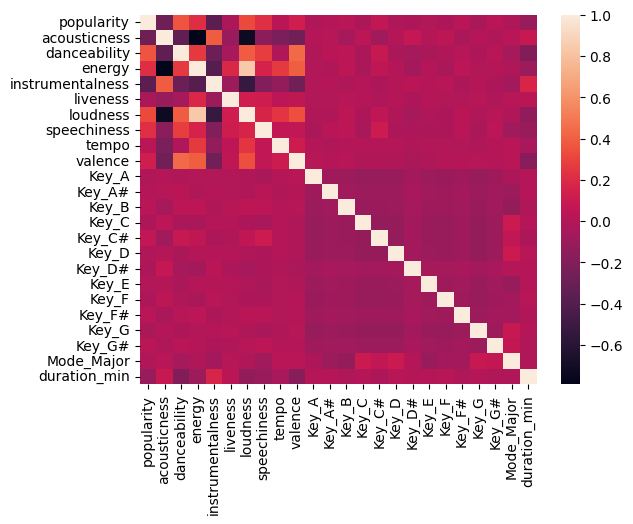

In [37]:
sns.heatmap(df1.drop(['music_genre'], axis=1).corr())

In [38]:
##Strong positive correlations
corr_matrix = df1.drop(['music_genre'], axis=1).corr()
corr_matrix = corr_matrix[(corr_matrix > 0.75) & (corr_matrix < 1.0)]
print(corr_matrix.stack())
##Strong negative correlations
corr_matrix = df1.drop(['music_genre'], axis=1).corr()
corr_matrix = corr_matrix[(corr_matrix < -0.75) & (corr_matrix > -1.0)]
print(corr_matrix.stack())

energy    loudness    0.838143
loudness  energy      0.838143
dtype: float64
acousticness  energy         -0.7909
energy        acousticness   -0.7909
dtype: float64


It seems energy is strongly positively correlated to loudness and strongly negatively correlated to acousticness.

We can choose to remove columns from this based on these results but we will keep for now and see if results are influenced with this. The reason to keep is importance of these features in predicting genre.

Split Data into training and testing:

In [39]:
from sklearn.model_selection import train_test_split
X = df1.drop(['music_genre'], axis=1)
y = df1['music_genre']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(28392, 24)
(12168, 24)
(28392,)
(12168,)


In [40]:
X_train.describe()

,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,Key_A,Key_A#,Key_B,Key_C,Key_C#,Key_D,Key_D#,Key_E,Key_F,Key_F#,Key_G,Key_G#,Mode_Major,duration_min
count,28392.000000,28392.000000,28392.000000,28392.000000,28392.000000,28392.000000,28392.000000,28392.000000,28392.000000,28392.000000,28392.000000,28392.000000,28392.000000,28392.000000,28392.000000,28392.000000,28392.000000,28392.00000,28392.000000,28392.000000,28392.000000,28392.000000,28392.000000,28392.000000
mean,0.447725,0.307986,0.538502,0.601084,0.181780,0.185516,0.746777,0.077050,0.460350,0.460548,0.096577,0.067202,0.075303,0.110172,0.110418,0.106051,0.032509,0.07407,0.086010,0.060616,0.114328,0.066744,0.643033,0.051254
std,0.157006,0.342894,0.193112,0.265331,0.326855,0.162813,0.121312,0.109357,0.164843,0.249153,0.295385,0.250376,0.263884,0.313109,0.313416,0.307908,0.177351,0.26189,0.280384,0.238628,0.318215,0.249583,0.479113,0.024376
min,0.000000,0.000000,0.000648,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.343434,0.019880,0.412781,0.432733,0.000000,0.088082,0.713546,0.014896,0.326026,0.260081,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.039082
50%,0.454545,0.144578,0.550950,0.644363,0.000159,0.117466,0.783008,0.029031,0.459888,0.451613,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,1.000000,0.047313
75%,0.565657,0.554217,0.677245,0.818675,0.149849,0.234599,0.824454,0.082418,0.569517,0.652218,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,1.000000,0.057981
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


#Model Creation

### 1. SVC

Lets try with poly kernel first

In [41]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

In [42]:
svc_model = SVC(kernel='poly')
svc_model.fit(X_train, y_train)

SVC(kernel='poly')

In [43]:
print(classification_report(y_train, svc_model.predict(X_train)))

              precision    recall  f1-score   support

 Alternative       0.44      0.41      0.43      2845
       Anime       0.73      0.68      0.70      2821
       Blues       0.59      0.55      0.57      2854
   Classical       0.81      0.85      0.83      2862
     Country       0.50      0.56      0.53      2829
  Electronic       0.65      0.61      0.63      2821
     Hip-Hop       0.49      0.60      0.54      2838
        Jazz       0.57      0.52      0.54      2820
         Rap       0.51      0.36      0.42      2809
        Rock       0.54      0.68      0.60      2893

    accuracy                           0.58     28392
   macro avg       0.58      0.58      0.58     28392
weighted avg       0.58      0.58      0.58     28392



In [44]:
print(classification_report(y_test, svc_model.predict(X_test)))

              precision    recall  f1-score   support

 Alternative       0.36      0.35      0.36      1206
       Anime       0.70      0.64      0.67      1243
       Blues       0.53      0.53      0.53      1192
   Classical       0.78      0.84      0.81      1174
     Country       0.48      0.51      0.49      1220
  Electronic       0.60      0.57      0.59      1211
     Hip-Hop       0.45      0.55      0.49      1239
        Jazz       0.54      0.48      0.51      1244
         Rap       0.45      0.31      0.37      1233
        Rock       0.52      0.65      0.58      1206

    accuracy                           0.54     12168
   macro avg       0.54      0.54      0.54     12168
weighted avg       0.54      0.54      0.54     12168



Now lets try with rbf kernel and try to fluctuate C from 0.1 to 100 and plot the elbow graph

In [45]:
for ele in [0.01, 0.1, 1, 10, 100, 1000]:
    svc_model = SVC(kernel='rbf', C=ele)
    svc_model.fit(X_train, y_train)
    print(f'C: {ele}')
    print(classification_report(y_test, svc_model.predict(X_test)))

C: 0.01


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

 Alternative       0.17      0.17      0.17      1206
       Anime       0.59      0.05      0.09      1243
       Blues       0.49      0.11      0.19      1192
   Classical       0.64      0.87      0.74      1174
     Country       0.23      0.70      0.35      1220
  Electronic       0.45      0.36      0.40      1211
     Hip-Hop       0.32      0.58      0.42      1239
        Jazz       0.43      0.28      0.34      1244
         Rap       0.00      0.00      0.00      1233
        Rock       0.31      0.29      0.30      1206

    accuracy                           0.34     12168
   macro avg       0.36      0.34      0.30     12168
weighted avg       0.36      0.34      0.30     12168

C: 0.1
              precision    recall  f1-score   support

 Alternative       0.32      0.37      0.34      1206
       Anime       0.68      0.51      0.58      1243
       Blues       0.52      0.44      0.48      1192
   Classical     

Since we can see that C = 1 and C = 10 are giving best results we can consider any of that with rbf kernel

### 2. Logistic Regression

In [46]:
from sklearn.linear_model import LogisticRegression
log_model = LogisticRegression()
log_model.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [47]:
from sklearn.model_selection import GridSearchCV
parameters = {'penalty': ['l1', 'l2'],
              'C': [0.001, 0.01, 0.1, 1, 10, 100]}
gs = GridSearchCV(LogisticRegression(), parameters, cv=5)
gs.fit(X_train, y_train)
print(f'Best parameters: {gs.best_params_}')
print(f'Best score: {gs.best_score_}')

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

Best parameters: {'C': 100, 'penalty': 'l2'}
Best score: 0.5314521573676239


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [48]:
log_model = LogisticRegression(C=100, penalty='l2')
log_model.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(C=100)

In [49]:
print(classification_report(y_test, log_model.predict(X_test)))

              precision    recall  f1-score   support

 Alternative       0.35      0.30      0.32      1206
       Anime       0.62      0.61      0.62      1243
       Blues       0.49      0.48      0.48      1192
   Classical       0.75      0.80      0.78      1174
     Country       0.44      0.53      0.48      1220
  Electronic       0.56      0.57      0.57      1211
     Hip-Hop       0.45      0.52      0.48      1239
        Jazz       0.49      0.41      0.44      1244
         Rap       0.47      0.32      0.38      1233
        Rock       0.52      0.65      0.57      1206

    accuracy                           0.52     12168
   macro avg       0.52      0.52      0.51     12168
weighted avg       0.51      0.52      0.51     12168



Text(0.5, 58.7222222222222, 'Predicted')

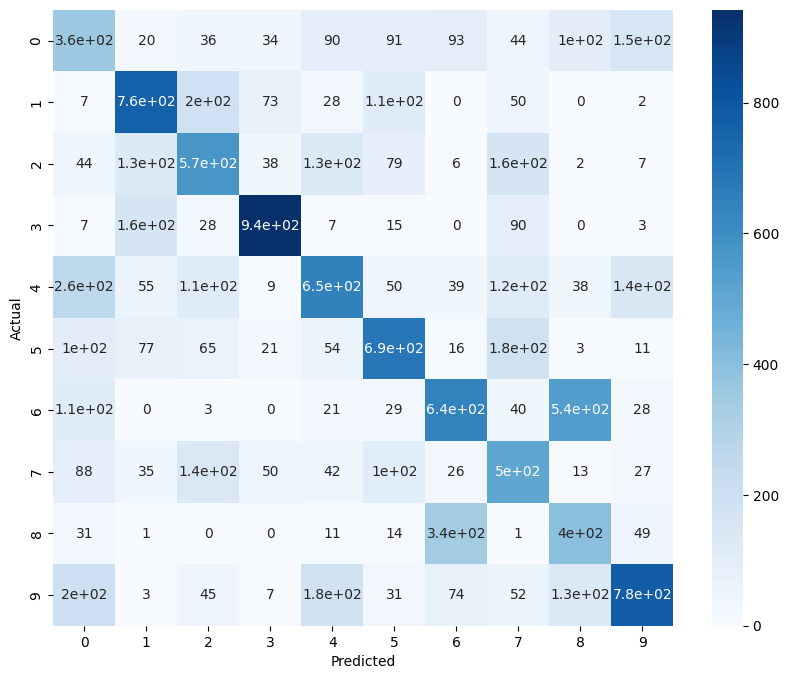

In [50]:
fig, ax = plt.subplots(figsize=(10,8))
sns.heatmap(confusion_matrix(log_model.predict(X_test), y_test), annot=True, cmap='Blues')
plt.ylabel("Actual")
plt.xlabel("Predicted")

### 3. Ensemble models (Bagging and Boosting)

In [51]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

Try with different alpha parameter and n_estimators as 10.

In [52]:
alpha = [0.01, 0.05, 0.1, 0.5, 1, 5, 10, 100]
accuracies = []
for ele in alpha:
  ada = AdaBoostClassifier(n_estimators=10, learning_rate=ele)
  ada.fit(X_train, y_train)
  y_pred = ada.predict(X_test)
  accuracies.append(accuracy_score(y_test, y_pred))
  print("For alpha = ", ele)
  print(classification_report(y_test, y_pred))

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


For alpha =  0.01


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/e

              precision    recall  f1-score   support

 Alternative       0.27      0.06      0.10      1206
       Anime       0.19      0.99      0.32      1243
       Blues       0.00      0.00      0.00      1192
   Classical       0.00      0.00      0.00      1174
     Country       0.17      0.04      0.06      1220
  Electronic       0.00      0.00      0.00      1211
     Hip-Hop       0.00      0.00      0.00      1239
        Jazz       0.00      0.00      0.00      1244
         Rap       0.00      0.00      0.00      1233
        Rock       0.23      0.98      0.37      1206

    accuracy                           0.21     12168
   macro avg       0.09      0.21      0.08     12168
weighted avg       0.09      0.21      0.08     12168

For alpha =  0.05


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/e

              precision    recall  f1-score   support

 Alternative       0.29      0.12      0.17      1206
       Anime       0.21      0.88      0.34      1243
       Blues       0.00      0.00      0.00      1192
   Classical       0.76      0.71      0.73      1174
     Country       0.00      0.00      0.00      1220
  Electronic       0.13      0.02      0.04      1211
     Hip-Hop       0.00      0.00      0.00      1239
        Jazz       0.37      0.01      0.02      1244
         Rap       0.00      0.00      0.00      1233
        Rock       0.23      0.98      0.37      1206

    accuracy                           0.27     12168
   macro avg       0.20      0.27      0.17     12168
weighted avg       0.20      0.27      0.17     12168

For alpha =  0.1


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/e

              precision    recall  f1-score   support

 Alternative       0.28      0.19      0.22      1206
       Anime       0.37      0.77      0.50      1243
       Blues       0.17      0.19      0.18      1192
   Classical       0.81      0.63      0.71      1174
     Country       0.20      0.03      0.06      1220
  Electronic       0.17      0.16      0.17      1211
     Hip-Hop       0.00      0.00      0.00      1239
        Jazz       0.40      0.09      0.15      1244
         Rap       0.00      0.00      0.00      1233
        Rock       0.24      0.96      0.38      1206

    accuracy                           0.30     12168
   macro avg       0.26      0.30      0.24     12168
weighted avg       0.26      0.30      0.23     12168

For alpha =  0.5
              precision    recall  f1-score   support

 Alternative       0.27      0.36      0.31      1206
       Anime       0.54      0.60      0.57      1243
       Blues       0.31      0.29      0.30      1192
   Clas

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


For alpha =  1
              precision    recall  f1-score   support

 Alternative       0.29      0.06      0.10      1206
       Anime       0.50      0.45      0.47      1243
       Blues       0.30      0.28      0.29      1192
   Classical       0.56      0.89      0.68      1174
     Country       0.49      0.39      0.43      1220
  Electronic       0.44      0.40      0.42      1211
     Hip-Hop       0.38      0.50      0.43      1239
        Jazz       0.35      0.20      0.26      1244
         Rap       0.32      0.36      0.34      1233
        Rock       0.40      0.65      0.50      1206

    accuracy                           0.42     12168
   macro avg       0.40      0.42      0.39     12168
weighted avg       0.40      0.42      0.39     12168



/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


For alpha =  5


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/e

              precision    recall  f1-score   support

 Alternative       0.00      0.00      0.00      1206
       Anime       0.00      0.00      0.00      1243
       Blues       0.00      0.00      0.00      1192
   Classical       0.03      0.00      0.00      1174
     Country       0.00      0.00      0.00      1220
  Electronic       0.00      0.00      0.00      1211
     Hip-Hop       0.00      0.00      0.00      1239
        Jazz       0.11      0.12      0.12      1244
         Rap       0.22      0.99      0.36      1233
        Rock       0.00      0.00      0.00      1206

    accuracy                           0.11     12168
   macro avg       0.04      0.11      0.05     12168
weighted avg       0.04      0.11      0.05     12168

For alpha =  10


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/e

              precision    recall  f1-score   support

 Alternative       0.00      0.00      0.00      1206
       Anime       0.30      0.00      0.00      1243
       Blues       0.00      0.00      0.00      1192
   Classical       0.26      0.89      0.41      1174
     Country       0.15      0.03      0.05      1220
  Electronic       0.00      0.00      0.00      1211
     Hip-Hop       0.00      0.00      0.00      1239
        Jazz       0.00      0.00      0.00      1244
         Rap       0.18      0.89      0.31      1233
        Rock       0.40      0.66      0.50      1206

    accuracy                           0.24     12168
   macro avg       0.13      0.25      0.13     12168
weighted avg       0.13      0.24      0.13     12168



/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:654: RuntimeWarning: overflow encountered in exp
  sample_weight *= np.exp(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: UserWarning: Sample weights have reached infinite values, at iteration 4, causing overflow. Iterations stopped. Try lowering the learning rate.
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


For alpha =  100
              precision    recall  f1-score   support

 Alternative       0.00      0.00      0.00      1206
       Anime       0.20      0.44      0.28      1243
       Blues       0.00      0.00      0.00      1192
   Classical       0.03      0.11      0.05      1174
     Country       0.00      0.00      0.00      1220
  Electronic       0.00      0.00      0.00      1211
     Hip-Hop       0.00      0.00      0.00      1239
        Jazz       0.00      0.00      0.00      1244
         Rap       0.23      0.99      0.37      1233
        Rock       0.00      0.00      0.00      1206

    accuracy                           0.16     12168
   macro avg       0.05      0.15      0.07     12168
weighted avg       0.05      0.16      0.07     12168



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


([<matplotlib.axis.XTick at 0x7ea35e0000d0>,
 [Text(0.01, 0, '$\\mathdefault{10^{-2}}$'),
  Text(0.05, 0, ''),
  Text(0.1, 0, '$\\mathdefault{10^{-1}}$'),
  Text(0.5, 0, ''),
  Text(1.0, 0, '$\\mathdefault{10^{0}}$'),
  Text(5.0, 0, ''),
  Text(10.0, 0, '$\\mathdefault{10^{1}}$'),
  Text(100.0, 0, '$\\mathdefault{10^{2}}$')])

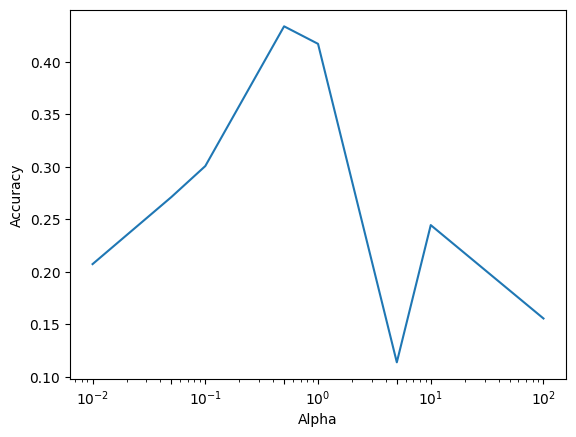

In [53]:
sns.lineplot(x=alpha, y=accuracies)
plt.xscale('log')
plt.xlabel('Alpha')
plt.ylabel('Accuracy')
plt.xticks(alpha)

Best alpha is 0.5. Lets now try different values of week estimators.

In [54]:
n = [1,5,10,50,100,500]
accuracies = []
for ele in n:
  ada = AdaBoostClassifier(n_estimators=ele, learning_rate=0.5)
  ada.fit(X_train, y_train)
  y_pred = ada.predict(X_test)
  accuracies.append(accuracy_score(y_test, y_pred))
  print("For n_estimator = ", ele)
  print(classification_report(y_test, y_pred))

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


For n_estimator =  1


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/e

              precision    recall  f1-score   support

 Alternative       0.00      0.00      0.00      1206
       Anime       0.18      0.99      0.31      1243
       Blues       0.00      0.00      0.00      1192
   Classical       0.00      0.00      0.00      1174
     Country       0.00      0.00      0.00      1220
  Electronic       0.00      0.00      0.00      1211
     Hip-Hop       0.00      0.00      0.00      1239
        Jazz       0.00      0.00      0.00      1244
         Rap       0.00      0.00      0.00      1233
        Rock       0.22      0.99      0.36      1206

    accuracy                           0.20     12168
   macro avg       0.04      0.20      0.07     12168
weighted avg       0.04      0.20      0.07     12168

For n_estimator =  5


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/e

              precision    recall  f1-score   support

 Alternative       0.26      0.08      0.12      1206
       Anime       0.32      0.08      0.13      1243
       Blues       0.26      0.34      0.30      1192
   Classical       0.76      0.70      0.73      1174
     Country       0.39      0.26      0.31      1220
  Electronic       0.29      0.52      0.37      1211
     Hip-Hop       0.43      0.60      0.50      1239
        Jazz       0.29      0.16      0.21      1244
         Rap       0.00      0.00      0.00      1233
        Rock       0.32      0.91      0.47      1206

    accuracy                           0.36     12168
   macro avg       0.33      0.37      0.31     12168
weighted avg       0.33      0.36      0.31     12168

For n_estimator =  10
              precision    recall  f1-score   support

 Alternative       0.27      0.36      0.31      1206
       Anime       0.54      0.60      0.57      1243
       Blues       0.31      0.29      0.30      1192
  

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


For n_estimator =  50
              precision    recall  f1-score   support

 Alternative       0.39      0.35      0.37      1206
       Anime       0.68      0.56      0.62      1243
       Blues       0.55      0.44      0.49      1192
   Classical       0.60      0.84      0.70      1174
     Country       0.56      0.46      0.51      1220
  Electronic       0.57      0.49      0.53      1211
     Hip-Hop       0.44      0.50      0.47      1239
        Jazz       0.42      0.39      0.40      1244
         Rap       0.43      0.40      0.41      1233
        Rock       0.49      0.71      0.58      1206

    accuracy                           0.51     12168
   macro avg       0.51      0.51      0.51     12168
weighted avg       0.51      0.51      0.51     12168



/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


For n_estimator =  100
              precision    recall  f1-score   support

 Alternative       0.40      0.29      0.34      1206
       Anime       0.65      0.54      0.59      1243
       Blues       0.58      0.33      0.42      1192
   Classical       0.50      0.90      0.64      1174
     Country       0.57      0.46      0.51      1220
  Electronic       0.61      0.46      0.53      1211
     Hip-Hop       0.43      0.43      0.43      1239
        Jazz       0.43      0.41      0.42      1244
         Rap       0.43      0.52      0.47      1233
        Rock       0.50      0.70      0.58      1206

    accuracy                           0.50     12168
   macro avg       0.51      0.50      0.49     12168
weighted avg       0.51      0.50      0.49     12168



/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


For n_estimator =  500
              precision    recall  f1-score   support

 Alternative       0.45      0.18      0.26      1206
       Anime       0.43      0.54      0.48      1243
       Blues       0.60      0.08      0.14      1192
   Classical       0.37      0.93      0.53      1174
     Country       0.60      0.30      0.40      1220
  Electronic       0.60      0.23      0.33      1211
     Hip-Hop       0.32      0.26      0.29      1239
        Jazz       0.37      0.39      0.38      1244
         Rap       0.37      0.75      0.50      1233
        Rock       0.53      0.48      0.50      1206

    accuracy                           0.41     12168
   macro avg       0.46      0.42      0.38     12168
weighted avg       0.46      0.41      0.38     12168



([<matplotlib.axis.XTick at 0x7ea35e170dc0>,
 [Text(1, 0, '$\\mathdefault{10^{0}}$'),
  Text(5, 0, ''),
  Text(10, 0, '$\\mathdefault{10^{1}}$'),
  Text(50, 0, ''),
  Text(100, 0, '$\\mathdefault{10^{2}}$'),
  Text(500, 0, '')])

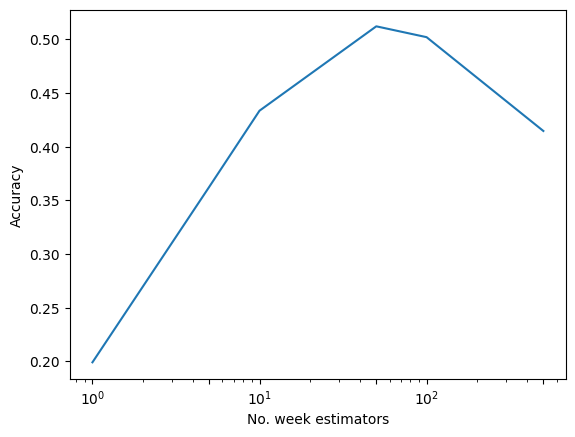

In [55]:
sns.lineplot(x=n, y=accuracies)
plt.xscale('log')
plt.xlabel('No. week estimators')
plt.ylabel('Accuracy')
plt.xticks(n)

So best parameters for Adaboosting are:

n_estimators = 50 and alpha = 0.5

**XGBoost (Boosting technique)**

In [56]:
y_train, _ = pd.factorize(y_train)
y_train = pd.Series(y_train)
y_test, _ = pd.factorize(y_test)
y_test = pd.Series(y_test)

In [57]:
!pip install xgboost
import xgboost
from sklearn.model_selection import GridSearchCV

grid_param = {
    'n_estimators': [1, 5, 10, 50, 100, 500],
    'alpha': [0.01, 0.05, 0.1, 0.5, 1, 5, 10]
    }

xgb = xgboost.XGBClassifier()
grid = GridSearchCV(xgb, grid_param, verbose=3)
grid.fit(X_train, y_train)

Fitting 5 folds for each of 42 candidates, totalling 210 fits
[CV 1/5] END ........alpha=0.01, n_estimators=1;, score=0.537 total time=   0.2s
[CV 2/5] END ........alpha=0.01, n_estimators=1;, score=0.538 total time=   0.2s
[CV 3/5] END ........alpha=0.01, n_estimators=1;, score=0.528 total time=   0.2s
[CV 4/5] END ........alpha=0.01, n_estimators=1;, score=0.518 total time=   0.2s
[CV 5/5] END ........alpha=0.01, n_estimators=1;, score=0.533 total time=   0.2s
[CV 1/5] END ........alpha=0.01, n_estimators=5;, score=0.571 total time=   0.5s
[CV 2/5] END ........alpha=0.01, n_estimators=5;, score=0.566 total time=   1.8s
[CV 3/5] END ........alpha=0.01, n_estimators=5;, score=0.560 total time=   1.9s
[CV 4/5] END ........alpha=0.01, n_estimators=5;, score=0.552 total time=   0.4s
[CV 5/5] END ........alpha=0.01, n_estimators=5;, score=0.564 total time=   0.5s
[CV 1/5] END .......alpha=0.01, n_estimators=10;, score=0.583 total time=   0.8s
[CV 2/5] END .......alpha=0.01, n_estimators=10

GridSearchCV(estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_b...one,
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             param_grid={'alpha': [0.01, 0.05, 0.1, 0.5, 1, 5, 10],
                         'n_estimators': [1, 5, 10, 50, 100, 500]},
             verbose=3)

In [58]:
grid.best_params_

{'alpha': 5, 'n_estimators': 50}

In [59]:
grid.best_score_

0.5880525639625321

**Bagging Classifier (Bagging technique)**

In [60]:
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier

bagging = BaggingClassifier(KNeighborsClassifier(), max_samples=0.5, max_features=0.5,
                           n_estimators=25, random_state=5)
bagging.fit(X_train, y_train)

BaggingClassifier(estimator=KNeighborsClassifier(), max_features=0.5,
                  max_samples=0.5, n_estimators=25, random_state=5)

In [61]:
bagging.score(X_test, y_test)

0.08053911900065747

In [62]:
print(classification_report(y_test, bagging.predict(X_test)))

              precision    recall  f1-score   support

           0       0.07      0.06      0.06      1211
           1       0.46      0.41      0.43      1239
           2       0.13      0.12      0.13      1244
           3       0.01      0.01      0.01      1206
           4       0.04      0.04      0.04      1192
           5       0.01      0.01      0.01      1233
           6       0.00      0.01      0.00      1174
           7       0.04      0.03      0.04      1243
           8       0.08      0.06      0.07      1220
           9       0.03      0.04      0.03      1206

    accuracy                           0.08     12168
   macro avg       0.09      0.08      0.08     12168
weighted avg       0.09      0.08      0.08     12168



### 4. RFC

alternate data for RFC

In [63]:
df2=df

In [64]:
df2['artist_name']=df2['artist_name'].astype(str)
df2['track_name']=df2['track_name'].astype(str)
df2['music_genre']=df2['music_genre'].astype(str)

In [65]:
df2['music_genre'] = df['music_genre'].str.strip().str.lower() #clean up spacing on genre names and make lower case
label_encoder = LabelEncoder() #target varaible encoder
df2['music_genre'] = label_encoder.fit_transform(df2['music_genre'])
df2['artist_name'] = LabelEncoder().fit_transform(df2['artist_name'].astype(str))
df2['track_name'] = LabelEncoder().fit_transform(df2['track_name'].astype(str))

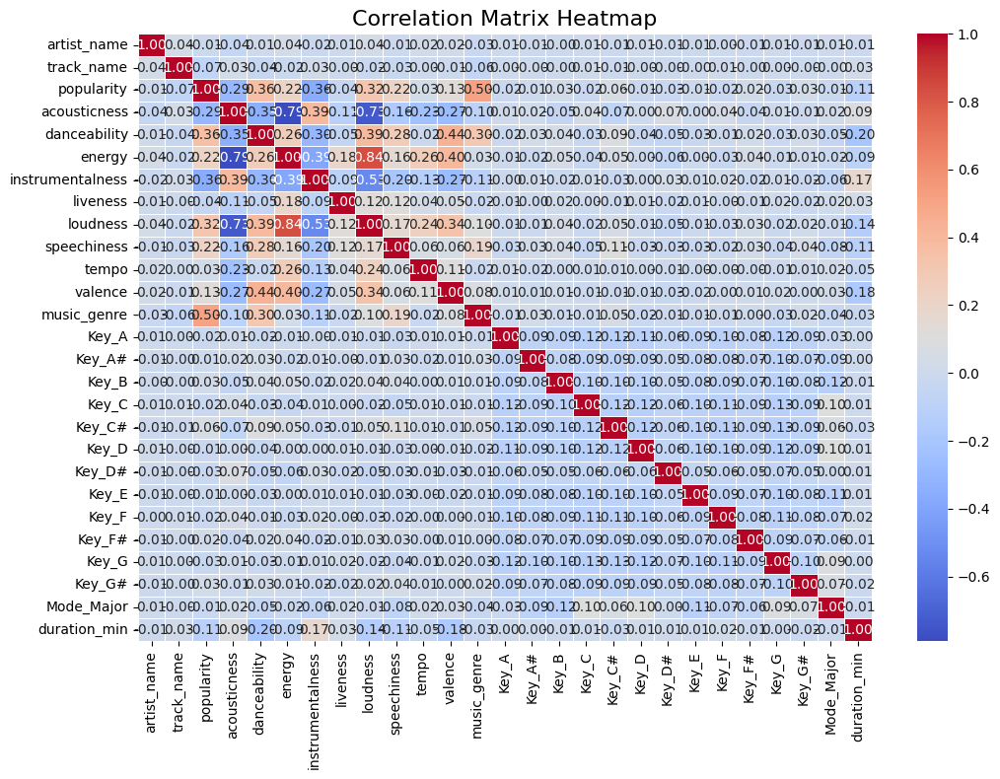

In [66]:
corr_matrix = df.corr()
# Create the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix Heatmap', fontsize=16)
plt.show()

new testing and training sets:

In [67]:
y = df2['music_genre']
X = df2.drop('music_genre', axis=1)

In [68]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [72]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=100, random_state=42)
rfc.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [73]:
y_pred = rfc.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred, target_names=label_encoder.classes_)
print("Accuracy:", accuracy)
print("Classification Report:\n", report)

Accuracy: 0.5628698224852071
Classification Report:
               precision    recall  f1-score   support

 alternative       0.39      0.34      0.36       797
       anime       0.81      0.79      0.80       827
       blues       0.62      0.55      0.59       792
   classical       0.87      0.87      0.87       821
     country       0.58      0.56      0.57       804
  electronic       0.66      0.61      0.63       843
     hip-hop       0.37      0.38      0.38       824
        jazz       0.54      0.53      0.54       782
         rap       0.32      0.32      0.32       782
        rock       0.49      0.64      0.55       840

    accuracy                           0.56      8112
   macro avg       0.56      0.56      0.56      8112
weighted avg       0.57      0.56      0.56      8112



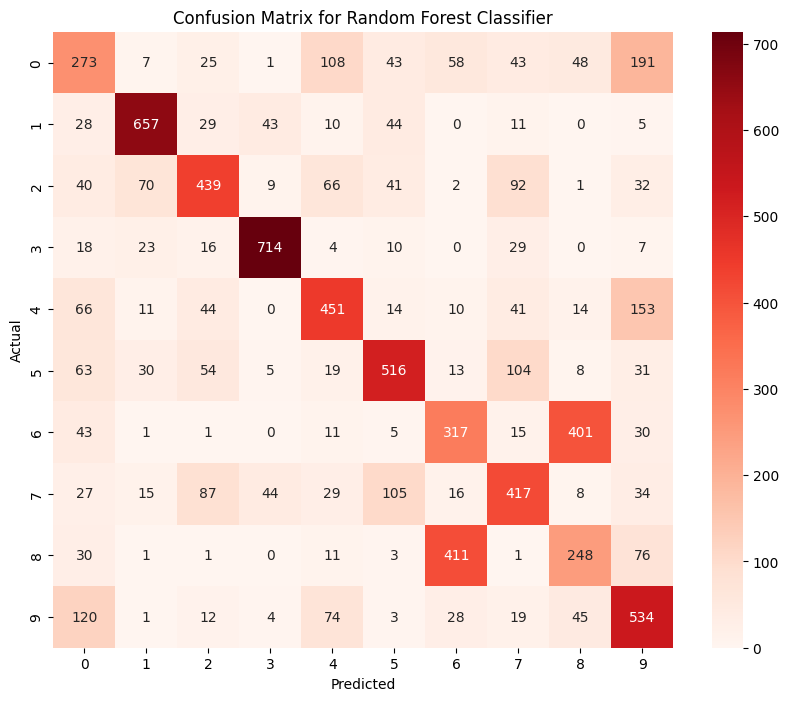

In [74]:
cm = confusion_matrix(y_test, y_pred)
# Plot the confusion matrix
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cm, annot=True, cmap='Reds', fmt='g', ax=ax)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for Random Forest Classifier")
plt.show()

### 5. KNN

Adjusted data frame for KNN

In [75]:
data=df

In [76]:
#first convert artist_name and track_name to string datatypes before applying TF-IDF
data['artist_name']=data['artist_name'].astype(str)
data['track_name']=data['track_name'].astype(str)
#this reduces the likelihood of errors and makes TF-IDF transoformation smoother

In [77]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Separate TF-IDF vectorizers for track_name and artist_name
tfidf_vectorizer_track = TfidfVectorizer()
tfidf_vectorizer_artist = TfidfVectorizer()

# Transform each column independently
tfidf_track_name = tfidf_vectorizer_track.fit_transform(data['track_name'].fillna(''))
tfidf_artist_name = tfidf_vectorizer_artist.fit_transform(data['artist_name'].fillna(''))

# Convert each TF-IDF matrix to a DataFrame
tfidf_track_name_df = pd.DataFrame(tfidf_track_name.toarray(), columns=tfidf_vectorizer_track.get_feature_names_out())
tfidf_artist_name_df = pd.DataFrame(tfidf_artist_name.toarray(), columns=tfidf_vectorizer_artist.get_feature_names_out())

In [78]:
tfidf_track_name_df.head(10)

,10,100,1000,10000,10001,10002,10003,10004,10005,10006,10007,10008,10009,1001,10010,10011,10012,10013,10014,10015,10016,10017,10018,10019,1002,10020,10021,10022,10023,10024,10025,10026,10027,10028,10029,1003,10030,10031,10032,10033,10034,10035,10036,10037,10038,10039,1004,10040,10041,10042,10043,10044,10045,10046,10047,10048,10049,1005,10050,10051,10052,10053,10054,10055,10056,10057,10058,10059,1006,10060,10061,10062,10063,10064,10065,10066,10067,10068,10069,1007,10070,10071,10072,10073,10074,10075,10076,10077,10078,10079,1008,10080,10081,10082,10083,10084,10085,10086,10087,10088,10089,1009,10090,10091,10092,10093,10094,10095,10096,10097,10098,10099,101,1010,10100,10101,10102,10103,10104,10105,10106,10107,10108,10109,1011,10110,10111,10112,10113,10114,10115,10116,10117,10118,10119,1012,10120,10121,10122,10123,10124,10125,10126,10127,10128,10129,1013,10130,10131,10132,10133,10134,10135,10136,10137,10138,10139,1014,10140,10141,10142,10143,10144,10145,10146,10147,10148,10149,1015,10150,10151,10152,10153,10154,10155,10156,10157,10158,10159,1016,10160,10161,10162,10163,10164,10165,10166,10167,10168,10169,1017,10170,10171,10172,10173,10174,10175,10176,10177,10178,10179,1018,10180,10181,10182,10183,10184,10185,10186,10187,10188,10189,1019,10190,10191,10192,10193,10194,10195,10196,10197,10198,10199,102,1020,10200,10201,10202,10203,10204,10205,10206,10207,10208,10209,1021,10210,10211,10212,10213,10214,10215,10216,10217,10218,10219,1022,10220,10221,10222,10223,10224,10225,10226,10227,10228,10229,1023,10230,10231,10232,10233,10234,10235,10236,10237,10238,10239,1024,10240,10241,10242,10243,10244,10245,10246,10247,10248,10249,1025,10250,10251,10252,10253,10254,10255,10256,10257,10258,10259,1026,10260,10261,10262,10263,10264,10265,10266,10267,10268,10269,1027,10270,10271,10272,10273,10274,10275,10276,10277,10278,10279,1028,10280,10281,10282,10283,10284,10285,10286,10287,10288,10289,1029,10290,10291,10292,10293,10294,10295,10296,10297,10298,10299,103,1030,10300,10301,10302,10303,10304,10305,10306,10307,10308,10309,1031,10310,10311,10312,10313,10314,10315,10316,10317,10318,10319,1032,10320,10321,10322,10323,10324,10325,10326,10327,10328,10329,1033,10330,10331,10332,10333,10334,10335,10336,10337,10338,10339,1034,10340,10341,10342,10343,10344,10345,10346,10347,10348,10349,1035,10350,10351,10352,10353,10354,10355,10356,10357,10358,10359,1036,10360,10361,10362,10363,10364,10365,10366,10367,10368,10369,1037,10370,10371,10372,10373,10374,10375,10376,10377,10378,10379,1038,10380,10381,10382,10383,10384,10385,10386,10387,10388,10389,1039,10390,10391,10392,10393,10394,10395,10396,10397,10398,10399,104,1040,10400,10401,10402,10403,10404,10405,10406,10407,10408,10409,1041,10410,10411,10412,10413,10414,10415,10416,10417,10418,10419,1042,10420,10421,10422,10423,10424,10425,10426,10427,10428,10429,1043,10430,10431,10432,10433,10434,10435,10436,10437,10438,10439,1044,10440,10441,10442,10443,10444,10445,10446,10447,10448,10449,1045,10450,10451,10452,10453,10454,10455,10456,10457,10458,10459,1046,10460,10461,10462,10463,10464,10465,10466,10467,10468,10469,1047,10470,10471,10472,10473,10474,10475,10476,10477,10478,10479,1048,10480,10481,10482,10483,10484,10485,10486,10487,10488,10489,1049,10490,10491,10492,10493,10494,10495,10496,10497,10498,10499,105,1050,10500,10501,10502,10503,10504,10505,10506,10507,10508,10509,1051,10510,10511,10512,10513,10514,10515,10516,10517,10518,10519,1052,10520,10521,10522,10523,10524,10525,10526,10527,10528,10529,1053,10530,10531,10532,10533,10534,10535,10536,10537,10538,10539,1054,10540,10541,10542,10543,10544,10545,10546,10547,10548,10549,1055,10550,10551,10552,10553,10554,10555,10556,10557,10558,10559,1056,10560,10561,10562,10563,10564,10565,10566,10567,10568,10569,1057,10570,10571,10572,10573,10574,10575,10576,10577,10578,10579,1058,10580,10581,10582,10583,10584,10585,10586,10587,10588,10589,1059,10590,10591,10592,10593,10594,10595,10596,10597,10598,10599,106,1060,10600,10601,10602,10603,10604,10605,10606,10607,10608,10609,106

why are all values 0??
tfidf matrices are naturally very sparse (most entries are 0)
pandas truncates the display of large dataframes and rounds very small numbers
with thousands of features (23,834 tracks and 8023 aritsts), most columns will be zero

In [79]:
tfidf_artist_name_df.head(10)

10  100  1000  1001  1002  1003  1004  1005  1006  1007  1008  1009  101  \
0  0.0  0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   
1  0.0  0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   
2  0.0  0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   
3  0.0  0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   
4  0.0  0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   
5  0.0  0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   
6  0.0  0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   
7  0.0  0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   
8  0.0  0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   
9  0.0  0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   

   1010  1011  1012  1013  1014  1015  1016  1017  1018  1019  102  1020  \
0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   
1   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   
2   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   
3   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   
4   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   
5   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   
6   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   
7   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   
8   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   
9   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   

   1021  1022  1023  1024  1025  1026  1027  1028  1029  103  1030  1031  \
0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   
1   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   
2   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   
3   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   
4   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   
5   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   
6   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   
7   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   
8   0.0   0.0   0.0   0.0   0.0   1.0   0.0   0.0   0.0  0.0   0.0   0.0   
9   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   

   1032  1033  1034  1035  1036  1037  1038  1039  104  1040  1041  1042  \
0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   0.0   
1   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   0.0   
2   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   0.0   
3   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   0.0   
4   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   0.0   
5   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   0.0   
6   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   0.0   
7   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   0.0   
8   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   0.0   
9   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   0.0   

   1043  1044  1045  1046  1047  1048  1049  105  1050  1051  1052  1053  \
0   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   0.0   0.0   
1   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   0.0   0.0   
2   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   0.0   0.0   
3   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   0.0   0.0   
4   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   0.0   0.0   
5   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   0.0   0.0   
6   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.0   0.0   0.0   0.0   0.0   
7   

In [80]:
data['track_name'].head(10)

,track_name
1,28983
2,12513
3,19498
4,7198
6,5379
7,6808
8,19031
9,15823
10,16875
11,18160


In [81]:
data['artist_name'].head(10)

,artist_name
1,5655
2,1476
3,1584
4,6031
6,2790
7,2341
8,2952
9,4824
10,1026
11,1965


In [83]:
#verifying my data and debugging to see if my tfidf works:
#tfidf transofmration is working.

# Check your input data first

print("Sample track names:", data['track_name'].head())
print("Sample artist names:", data['artist_name'].head())

# Check if the vectorizers are capturing any features
print("Number of track features:", len(tfidf_vectorizer_track.get_feature_names_out()))
print("Number of artist features:", len(tfidf_vectorizer_artist.get_feature_names_out()))

# Add preprocessing parameters to the TfidfVectorizer
tfidf_vectorizer_track = TfidfVectorizer(
    min_df=1,  # Include terms that appear in at least 1 document
    max_df=1.0,  # Include all terms, even if they appear in all documents
    strip_accents='unicode',
    lowercase=True,
    token_pattern=r'(?u)\b\w+\b'  # Matches any word character
)

tfidf_vectorizer_artist = TfidfVectorizer(
    min_df=1,
    max_df=1.0,
    strip_accents='unicode',
    lowercase=True,
    token_pattern=r'(?u)\b\w+\b'
)

# Transform the data
tfidf_track_name = tfidf_vectorizer_track.fit_transform(data['track_name'].fillna(''))
tfidf_artist_name = tfidf_vectorizer_artist.fit_transform(data['artist_name'].fillna(''))

# Convert to DataFrames
tfidf_track_name_df = pd.DataFrame(
    tfidf_track_name.toarray(),
    columns=tfidf_vectorizer_track.get_feature_names_out()
)
tfidf_artist_name_df = pd.DataFrame(
    tfidf_artist_name.toarray(),
    columns=tfidf_vectorizer_artist.get_feature_names_out()
)

# Check non-zero elements
print("\nTrack name matrix sparsity:", (tfidf_track_name != 0).sum() / tfidf_track_name.size)
print("Artist name matrix sparsity:", (tfidf_artist_name != 0).sum() / tfidf_artist_name.size)

# Look at specific examples
print("\nSample track TF-IDF row:", tfidf_track_name_df.iloc[0].sum())
print("Sample artist TF-IDF row:", tfidf_artist_name_df.iloc[0].sum())

Sample track names: 1    28983
2    12513
3    19498
4     7198
6     5379
Name: track_name, dtype: object
Sample artist names: 1    5655
2    1476
3    1584
4    6031
6    2790
Name: artist_name, dtype: object
Number of track features: 34670
Number of artist features: 6353

Track name matrix sparsity: 1.0
Artist name matrix sparsity: 1.0

Sample track TF-IDF row: 1.0
Sample artist TF-IDF row: 1.0


Showing my first 5 track names are properly loaded and include special characters
feature counts is showing 8023 unique terms from artist names
tfidf vectorizer identified 23834 unique terms from track names
sparsity values of 1.0 means all documents (tracks/artists) have some terms that are considered important
sample row sums: the first track has a total tfidf score of 1.88 (sum of all term weights)
the first artist has a total of tfidf score of 1.0
these non-zero values indicate the tfidf is working correctly

I may be getting zeroes because the dataframe display might be rounding very small numbers to zero
the sparse nature of tfidf means most values will be zero, with only a few non-zero values per row

to verify, the code below shows the tfidf scores for the first track in my dataset ("Röyksopp's Night Out"):
-the vectorizer has broken down the track name into individual tokens:
-night has a score of 0.406170
-out has a score of 406170..and so on.
the score indicates the importance of each term:
-higher scores mean the term is more unique/distinctive in your dataset
-royksopp has the highest score at 0.75 because it's likely a more unique term
-night and out have more similar scores around 0.40 because they are more common words
-s has the lowest score at 0.31 as it's likely a common term across tracks
-these scores matter because higher scores like royksopp are more useufll for distinguishing this track from others
-common words get lower scores to reduce their impat on similarity calculations
-the sum of these scores ~1.88 is what we saw earlier in the earlier output

In [84]:
# Show non-zero values in first row of track names
print("Non-zero features in first track:")
non_zero_track = tfidf_track_name_df.iloc[0][tfidf_track_name_df.iloc[0] > 0]
print(non_zero_track)

# Show non-zero values in first row of artist names
print("\nNon-zero features in first artist:")
non_zero_artist = tfidf_artist_name_df.iloc[0][tfidf_artist_name_df.iloc[0] > 0]
print(non_zero_artist)

Non-zero features in first track:
28983    1.0
Name: 0, dtype: float64

Non-zero features in first artist:
5655    1.0
Name: 0, dtype: float64


In [85]:
#to verify and better visualize my data:
# Check the shape of your TF-IDF matrices
print("Track TF-IDF shape:", tfidf_track_name_df.shape)
print("Artist TF-IDF shape:", tfidf_artist_name_df.shape)

# Look at non-zero elements in each row
print("\nFirst 5 rows - number of non-zero elements:")
for i in range(5):
    non_zeros = (tfidf_track_name_df.iloc[i] > 0).sum()
    print(f"Row {i}: {non_zeros} non-zero elements")

# Display options to see more decimal places
pd.set_option('display.float_format', lambda x: '%.6f' % x)

# Look at specific columns that should have values
print("\nSample of non-zero values in first row:")
first_row = tfidf_track_name_df.iloc[0]
non_zero_cols = first_row[first_row > 0]
print(non_zero_cols.head())

Track TF-IDF shape: (40560, 34680)
Artist TF-IDF shape: (40560, 6363)

First 5 rows - number of non-zero elements:
Row 0: 1 non-zero elements
Row 1: 1 non-zero elements
Row 2: 1 non-zero elements
Row 3: 1 non-zero elements
Row 4: 1 non-zero elements

Sample of non-zero values in first row:
28983   1.000000
Name: 0, dtype: float64


Loading data...
Preprocessing numerical data...
Cleaning numerical data...
Scaling numerical data...
Creating text features...
Preparing final feature matrix...
Preparing target variable...

Performing Cross-Validation...
k=1: Mean CV Accuracy=0.4091 ± 0.0039
k=5: Mean CV Accuracy=0.4415 ± 0.0050
k=10: Mean CV Accuracy=0.4478 ± 0.0041
k=50: Mean CV Accuracy=0.4404 ± 0.0073
k=100: Mean CV Accuracy=0.4273 ± 0.0038


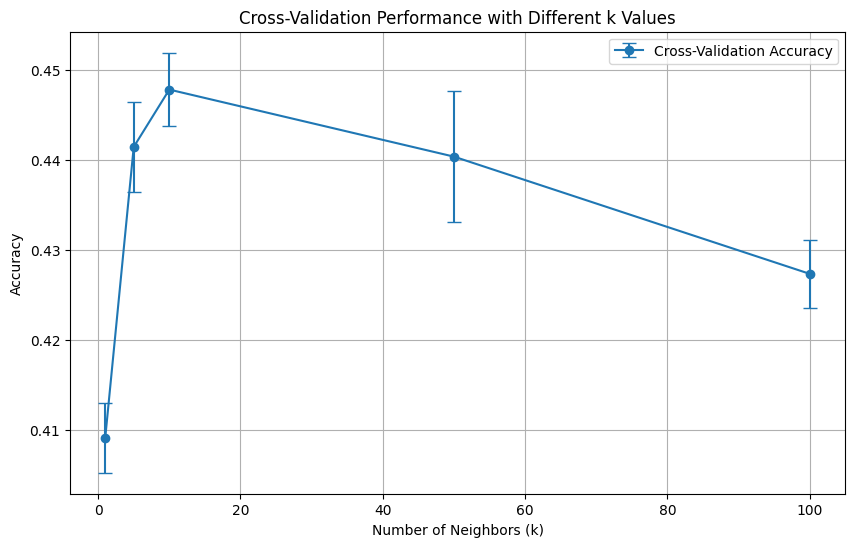


Best Results from Cross-Validation:
Best k value: 10
Best cross-validation accuracy: 0.4478


In [87]:
#music_genre classification with knn and cross-validation

import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score
from scipy.sparse import hstack, vstack, csr_matrix
import gc
import matplotlib.pyplot as plt

def clean_numerical_data(data):
    numeric_cols = data.select_dtypes(include=['float64']).columns

    for col in numeric_cols:
        data[col] = data[col].replace([np.inf, -np.inf], np.nan)
        median_val = data[col].median()
        data[col] = data[col].fillna(median_val)

        mean = data[col].mean()
        std = data[col].std()
        data[col] = data[col].clip(lower=mean - 3*std, upper=mean + 3*std)

    return data, numeric_cols

def preprocess_numerical_data(data, numeric_cols):
    scaler = MinMaxScaler()
    data[numeric_cols] = scaler.fit_transform(data[numeric_cols])
    return data

def create_sparse_features(data, chunk_size=1000):
    track_vectorizer = TfidfVectorizer(max_features=1000)
    artist_vectorizer = TfidfVectorizer(max_features=500)

    data['track_name'] = data['track_name'].fillna('').astype(str)
    data['artist_name'] = data['artist_name'].fillna('').astype(str)

    track_features = None
    artist_features = None

    for i in range(0, len(data), chunk_size):
        chunk = data.iloc[i:i+chunk_size]

        if track_features is None:
            track_features = track_vectorizer.fit_transform(chunk['track_name'])
        else:
            chunk_track = track_vectorizer.transform(chunk['track_name'])
            track_features = vstack([track_features, chunk_track])

        if artist_features is None:
            artist_features = artist_vectorizer.fit_transform(chunk['artist_name'])
        else:
            chunk_artist = artist_vectorizer.transform(chunk['artist_name'])
            artist_features = vstack([artist_features, chunk_artist])

        gc.collect()

    return track_features, artist_features, track_vectorizer, artist_vectorizer

def perform_cross_validation(X, y, k_values, n_splits=5):
    cv_mean_scores = []
    cv_std_scores = []

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    for k in k_values:
        knn = KNeighborsClassifier(n_neighbors=k, weights='distance')
        cv_scores = cross_val_score(knn, X, y, cv=skf, scoring='accuracy')

        cv_mean_scores.append(np.mean(cv_scores))
        cv_std_scores.append(np.std(cv_scores))

        print(f"k={k}: Mean CV Accuracy={cv_mean_scores[-1]:.4f} ± {cv_std_scores[-1]:.4f}")

    return cv_mean_scores, cv_std_scores

def plot_cross_validation_results(k_values, cv_mean_scores, cv_std_scores):
    plt.figure(figsize=(10, 6))
    plt.errorbar(
        k_values,
        cv_mean_scores,
        yerr=cv_std_scores,
        fmt='o-',
        capsize=5,
        label='Cross-Validation Accuracy'
    )
    plt.xlabel('Number of Neighbors (k)')
    plt.ylabel('Accuracy')
    plt.title('Cross-Validation Performance with Different k Values')
    plt.grid(True)
    plt.legend()
    plt.show()

def main(data_path, test_size=0.2, random_state=42):
    print("Loading data...")
    data = pd.read_csv(data_path)


    print("Preprocessing numerical data...")
    data['tempo'] = data['tempo'].replace('?', np.nan)
    data['tempo'] = pd.to_numeric(data['tempo'], errors='coerce')

    data['mode'] = data['mode'].map({'Minor': 0, 'Major': 1})
    data['mode'] = data['mode'].fillna(data['mode'].mode()[0])

    if 'key' in data.columns:
        data = pd.get_dummies(data, columns=['key'], prefix='key')

    print("Cleaning numerical data...")
    data, numeric_cols = clean_numerical_data(data)

    print("Scaling numerical data...")
    data = preprocess_numerical_data(data, numeric_cols)

    print("Creating text features...")
    track_features, artist_features, _, _ = create_sparse_features(data)

    print("Preparing final feature matrix...")
    numerical_features = data[numeric_cols].values
    numerical_features_sparse = csr_matrix(numerical_features)

    X = hstack([
        track_features,
        artist_features,
        numerical_features_sparse
    ])

    print("Preparing target variable...")
    label_encoder = LabelEncoder()
    y = label_encoder.fit_transform(data['music_genre'])

    # Define k values dynamically
    k_values = [
      1,5,10,50,100
    ]

    print("\nPerforming Cross-Validation...")
    cv_mean_scores, cv_std_scores = perform_cross_validation(X, y, k_values, n_splits=5)

    plot_cross_validation_results(k_values, cv_mean_scores, cv_std_scores)

    best_k_index = np.argmax(cv_mean_scores)
    best_k = k_values[best_k_index]
    best_score = cv_mean_scores[best_k_index]

    print(f"\nBest Results from Cross-Validation:")
    print(f"Best k value: {best_k}")
    print(f"Best cross-validation accuracy: {best_score:.4f}")

    final_model = KNeighborsClassifier(n_neighbors=best_k, weights='distance')
    final_model.fit(X, y)

    return final_model, label_encoder, best_k, best_score

if __name__ == "__main__":
    data_path = "music_genre.csv"
    best_model, label_encoder, best_k, best_score = main(data_path)

### 6. Clustering:

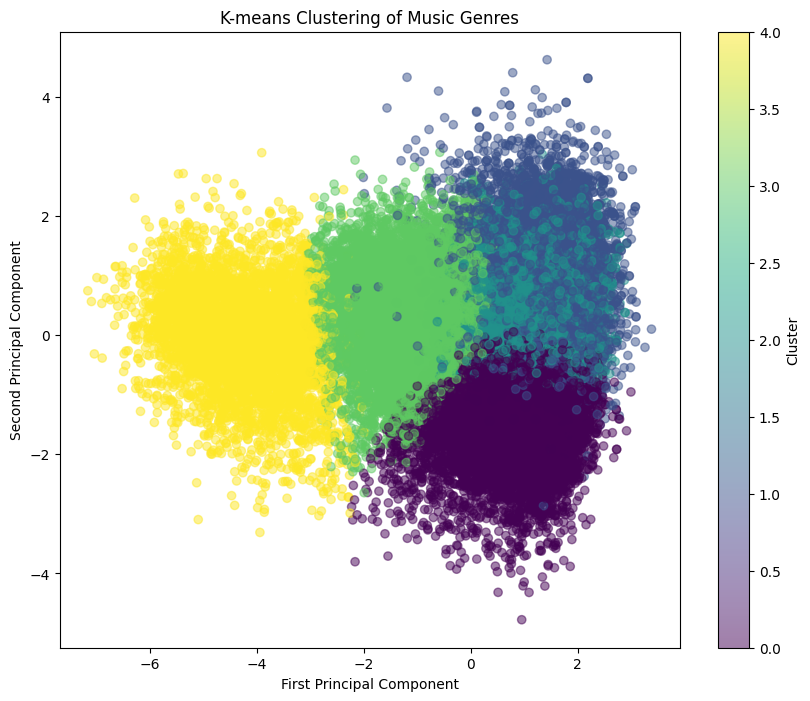

In [88]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

df4=df #new df
df4['music_genre'] = pd.Categorical(df4['music_genre']).codes

numerical_features = ['popularity', 'acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo', 'valence']

X = df4[numerical_features]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

#Kmeans cluster
kmeans = KMeans(n_clusters=5, random_state=42)
cluster_labels = kmeans.fit_predict(X_scaled)

#PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=cluster_labels, cmap='viridis', alpha=0.5)
plt.title('K-means Clustering of Music Genres')
plt.xlabel('First Principal Component')
plt.ylabel('Second Principal Component')
plt.colorbar(scatter, label='Cluster')
plt.show()

cluster_centers = scaler.inverse_transform

In [89]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# True labels
true_labels = df4['music_genre']

# Adjusted Rand Index
ari_score = adjusted_rand_score(true_labels, cluster_labels)
print(f"Adjusted Rand Index (ARI): {ari_score}")

# Normalized Mutual Information
nmi_score = normalized_mutual_info_score(true_labels, cluster_labels)
print(f"Normalized Mutual Information (NMI): {nmi_score}")

Adjusted Rand Index (ARI): 0.11312146979453233
Normalized Mutual Information (NMI): 0.21452588789184063


### 7. Decision Tree

In [98]:
df_music = pd.read_csv('music_genre.csv')
df_music = df_music.replace('?', np.nan)
df_music = df_music.dropna() #reload and encode categorical

In [99]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
label_encoder = LabelEncoder()
df_music['key'] = label_encoder.fit_transform(df_music['key'])
df_music['mode'] = label_encoder.fit_transform(df_music['mode'])
df_music['music_genre'] = label_encoder.fit_transform(df_music['music_genre'])  # Target label encoding

Dropping all these columns as they do not impact or result in helping our analysis in the prediction of target class

In [100]:
df_music.drop(['instance_id', 'artist_name', 'track_name', 'obtained_date'], axis=1, inplace=True)

In [101]:
X = df_music.drop(columns=['music_genre']).values
y = df_music['music_genre'].values

from sklearn.preprocessing import StandardScaler
# Standardize the feature values
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [102]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
basic_tree_model = DecisionTreeClassifier(random_state=42)
cross_val_scores = cross_val_score(basic_tree_model, X_train, y_train, cv=5)
print("Cross-validation scores:", cross_val_scores)
print("Average cross-validation score:", np.mean(cross_val_scores))

Cross-validation scores: [0.43420322 0.4244065  0.43481883 0.4382896  0.43301402]
Average cross-validation score: 0.43294643334109584


5-fold cross-validation is being used here. Model is trained and validated across different subsets of the training data, and the average score is printed to assess model performance

**Hyperparemeter Tuning using GridSearchCV:**
GridSearchCV is used to tune hyperparameters criterion, max_depth, min_samples_split, and min_samples_leaf of the decision tree. Different combinations to see the results

In [103]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
grid_search = GridSearchCV(DecisionTreeClassifier(random_state=42), param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Best parameters from GridSearch:", grid_search.best_params_)
print("Best cross-validation score from GridSearch:", grid_search.best_score_)

Best parameters from GridSearch: {'criterion': 'entropy', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 10}
Best cross-validation score from GridSearch: 0.5197134299107125


In [104]:
best_tree_model = grid_search.best_estimator_
best_tree_model.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=2,
                       min_samples_split=10, random_state=42)

Classification Report:

In [105]:
from sklearn.metrics import classification_report, confusion_matrix
y_pred = best_tree_model.predict(X_test)

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[298   8  21   3 105  49  74  45  34 219]
 [ 25 628  82  59  42  57   1  16   2   7]
 [ 52  97 365  13  96  77   5 111   3  54]
 [ 25  50  34 689   4  22   0  51   0   6]
 [107  11  55   1 456  14  19  61  13 184]
 [ 91  52  81  12  48 467  25 109  13  33]
 [ 47   0   1   0  15  10 457   7 284  84]
 [ 72  20 109  58  80 117  16 373   8  35]
 [ 30   0   0   0  11  11 407   4 321 130]
 [100   3   5   2  50   7  42  29  50 628]]

Classification Report:
              precision    recall  f1-score   support

           0       0.35      0.35      0.35       856
           1       0.72      0.68      0.70       919
           2       0.48      0.42      0.45       873
           3       0.82      0.78      0.80       881
           4       0.50      0.50      0.50       921
           5       0.56      0.50      0.53       931
           6       0.44      0.50      0.47       905
           7       0.46      0.42      0.44       888
           8       0.44      0.35      0

**How Important is the feature model?**

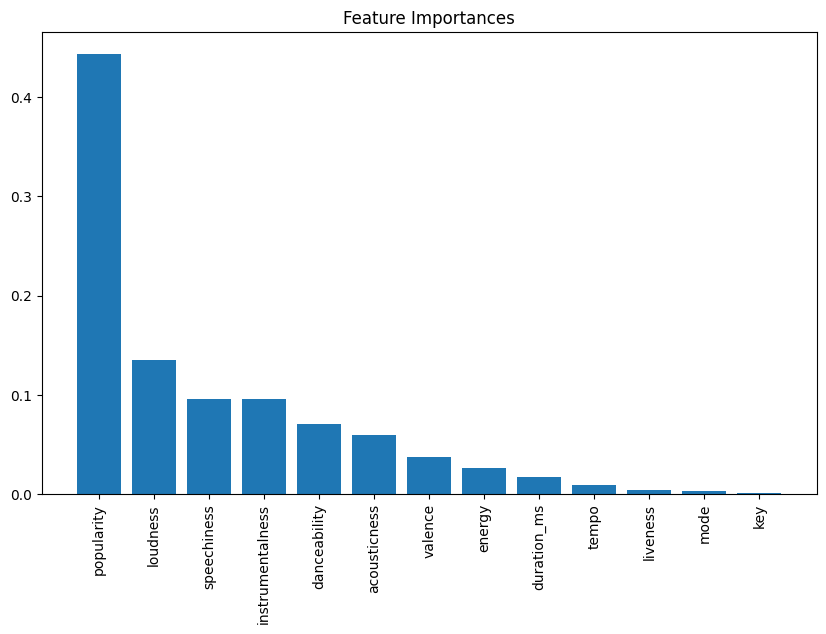

In [106]:
importances = best_tree_model.feature_importances_
indices = np.argsort(importances)[::-1]
feature_names = df_music.drop(columns=['music_genre']).columns

plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.bar(range(X.shape[1]), importances[indices], align="center")
plt.xticks(range(X.shape[1]), [feature_names[i] for i in indices], rotation=90)
plt.show()

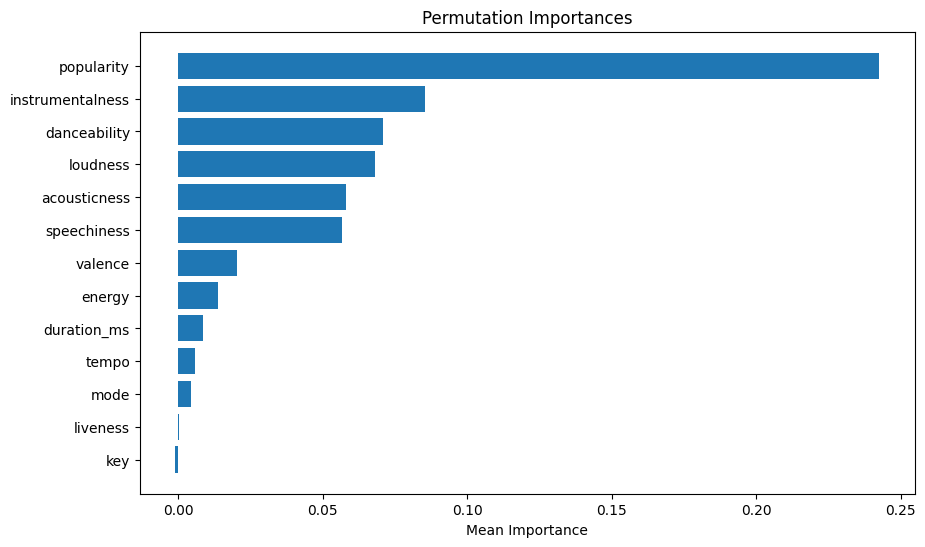

In [107]:
from sklearn.inspection import permutation_importance
perm_importance = permutation_importance(best_tree_model, X_test, y_test, n_repeats=10, random_state=42)
sorted_idx = perm_importance.importances_mean.argsort()

plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx)), perm_importance.importances_mean[sorted_idx], align="center")
plt.yticks(range(len(sorted_idx)), [feature_names[i] for i in sorted_idx])
plt.title("Permutation Importances")
plt.xlabel("Mean Importance")
plt.show()

#Comparisons

In [109]:
results = {
    'SVC': {
        'Accuracy': 0.54,
    },
    'XGBoost (Ensemble)': {
        'Accuracy': 0.588,
    },
    'Adaboost (Ensemble)': {
        'Accuracy': 0.43,
    },
    'Bagging (Ensemble)': {
        'Accuracy': 0.08,
    },
    'LogisticRegression': {
        'Accuracy': 0.52,
    },
    'RandomForest': {
        'Accuracy': 0.57,
    },
    'KNN': {
        'Accuracy': 0.4509,
    },
    'Clustering': {
        'Accuracy': 0.21,
    },        # Act NMI: these values do not directly translate to accuracy but provide a comparable measure of clustering quality
    'Decision Tree': {
        'Accuracy': 0.52,
    },
}


In [110]:
#the dictionary into a DataFrame
results_df = pd.DataFrame(results).T
print(results_df)

                     Accuracy
SVC                  0.540000
XGBoost (Ensemble)   0.588000
Adaboost (Ensemble)  0.430000
Bagging (Ensemble)   0.080000
LogisticRegression   0.520000
RandomForest         0.570000
KNN                  0.450900
Clustering           0.210000
Decision Tree        0.520000


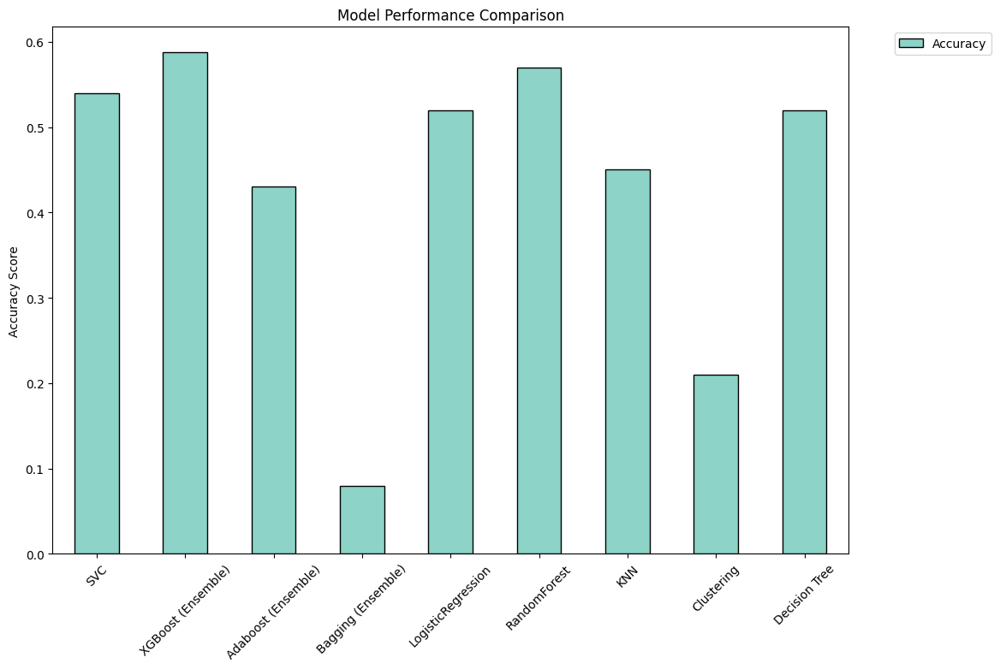

In [111]:
#bar plots:
results_df.plot(kind='bar', figsize=(12, 8), colormap='Set3', edgecolor='black')
plt.title("Model Performance Comparison")
plt.ylabel("Accuracy Score")
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()